# Research question : Out-of-sample performance of machine learning methods in terms of mutual fund excess returns
----------------------------------------------
We used the method of the article by Kaniel et al. recommended in the project, and the two other articles that support our research question, namely:
1.	Empirical Asset Pricing via Machine Learning , Shihao Gu, Bryan Kelly, Dacheng Xiu ;
2.	Dietterich, T. G. 2000. Ensemble methods in machine learning. In International workshop on multiple classier systems, eds. F. Schwenker, F. Roli, and J. Kittler, 1-15. New York: Springer.
3.Shihao Gu, Bryan Kelly, and Dacheng Xiu. Empirical asset pricing via machine learning. The
Review of Financial Studies, 33(5):2223–2273, 2020.

# PART I : EXPLORATORY ANALYSIS AND VARIABLES SELECTION VIA LASSO
-------------------------------------------------------------------------------------------------

In [1]:
import pandas as pd
import seaborn as sns
import pandas as pd
import tqdm

import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from statsmodels.tools.tools import add_constant
from numpy.core.multiarray import result_type
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LassoCV, Lasso
from sklearn.metrics import mean_squared_error

import numpy as np
import matplotlib.pyplot as plt

## I. EXPLORATORY ANALYSIS
--------------------------------------------------------------------------

1. Understanding the data through some plots ; 
2. Computing excess return as advised on the Kaniel's and al's reference;
3. Feature selection via LASSO.

In [2]:
# The project's dataset
data = pd.read_excel(r'./Project_ASM.xlsx')

# Sorting by date
data.sort_values(by='Date', inplace=True)

# Display the first 3 rows of the DataFrame
print("\nProject's Dataset:")
data['date'] = data['Date']
print(data.head(3))

# Print the shape of the DataFrame
print("Shape of Project's Dataset:", data.shape)
unique_dates = data['date'].unique()
len(unique_dates)


Project's Dataset:
               Date                             Fund.Name Ticker  \
203474  2007.333333  MFS International Intrinsic Value R6  MINJX   
203475  2007.416667  MFS International Intrinsic Value R6  MINJX   
203476  2007.500000  MFS International Intrinsic Value R6  MINJX   

       Global.Broad.Category          Global.Category           US.Category  \
203474                Equity  Global Equity Large Cap  International Equity   
203475                Equity  Global Equity Large Cap  International Equity   
203476                Equity  Global Equity Large Cap  International Equity   

       Firm.Name Inception.Date Longest.Manager.Tenure Average.Manager.Tenure  \
203474       MFS     2006-05-01                  14,92                   9,29   
203475       MFS     2006-05-01                  14,92                   9,29   
203476       MFS     2006-05-01                  14,92                   9,29   

        Return  Dividend.Yield Management.Fee  NAV (USD)         

197

In [4]:
from datetime import datetime, timedelta

# Conversion funtion
def decimal_to_date(decimal_year):
    year = int(decimal_year)
    fraction = decimal_year - year
    month = int(fraction * 12) + 1
    date = datetime(year, month, 1)
    formatted_date = date.strftime('%Y%m')
    return formatted_date

data['Date'] = data['Date'].apply(decimal_to_date)

# Set 'Date' column as index column 
data.set_index('Date',inplace=True)
data.tail(3)

,Fund.Name,Ticker,Global.Broad.Category,Global.Category,US.Category,Firm.Name,Inception.Date,Longest.Manager.Tenure,Average.Manager.Tenure,Return,Dividend.Yield,Management.Fee,NAV (USD),date
Date,,,,,,,,,,,,,,
202309,Columbia Large Cap Growth E,CLGEX,Equity,US Equity Large Cap Growth,U.S. Equity,Columbia Threadneedle,2006-09-22,"3,92","3,25",-5.92,0.01,"0,64",13905429,2023.666667
202309,PGIM Quant Solutions Large-Cap Val A,SUVAX,Equity,US Equity Large Cap Value,U.S. Equity,PGIM Investments,2001-03-30,"9,50","9,50",-3.25,0.03,"0,79",33706680,2023.666667
202309,KL Allocation Advisor,GAVAX,Allocation,Flexible Allocation,Allocation,Knowledge Leaders Capital,2010-09-30,"13,08","13,08",-3.22,0.01,"0,90",6105515,2023.666667


In [7]:
# Converting 'Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Management.Fee' features into the 
# correct form

columns_to_convert = ['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Management.Fee']

data[columns_to_convert] = data[columns_to_convert].replace(',', '', regex=True).apply(pd.to_numeric, errors='coerce')

In [5]:
# Adding others features : Momentum feature
data_MOM = pd.read_csv(r'./F-F_Momentum_Factor.csv')

# Set the 'Date' column as the index
data_MOM.set_index('Date', inplace=True)

# Display the first 5 rows of the Momentum DataFrame
print("\nMomentum Feature:")
print(data_MOM.head(3))


Momentum Feature:
         Mom   
Date           
192701     0.36
192702    -2.14
192703     3.61


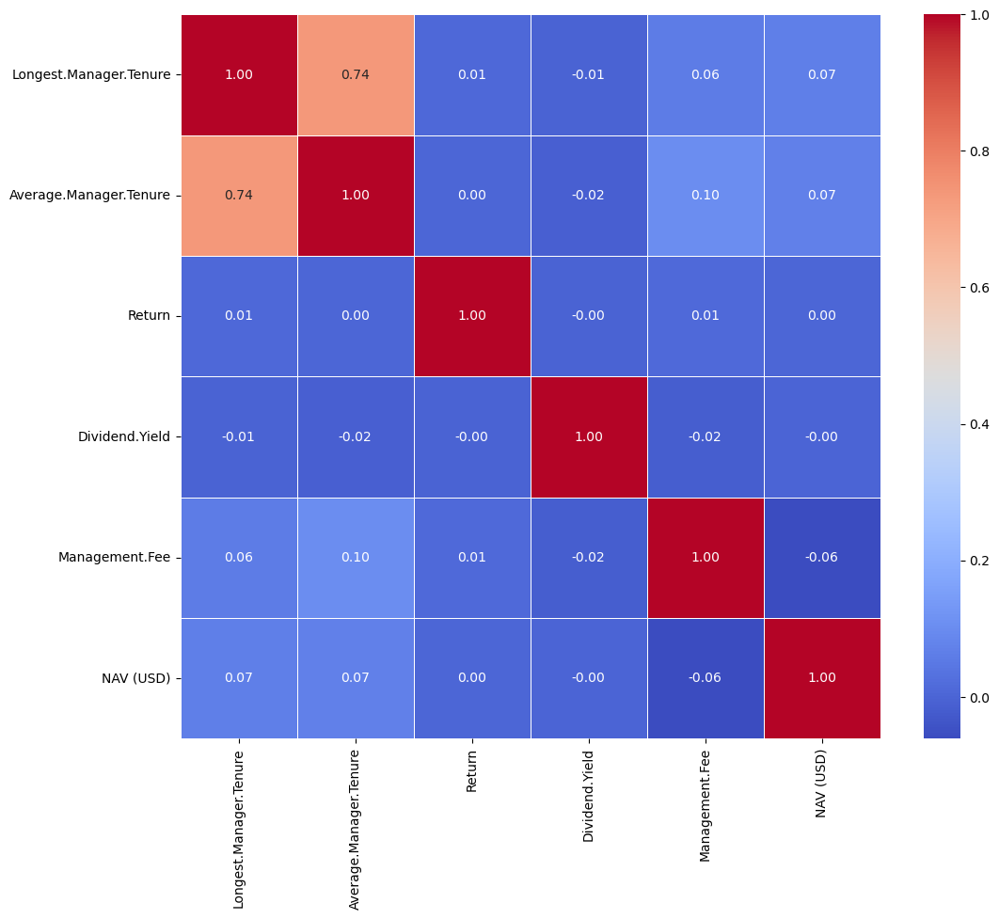

In [8]:
# Select only quantitative features for the correlation matrix
quant_features = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
                       'Management.Fee', 'NAV (USD)']]

# Compute the correlation matrix
correlation_matrix = quant_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Show the plot
plt.show()

Weak correlation values observed typically meaning there is no linear relationship among the variables.

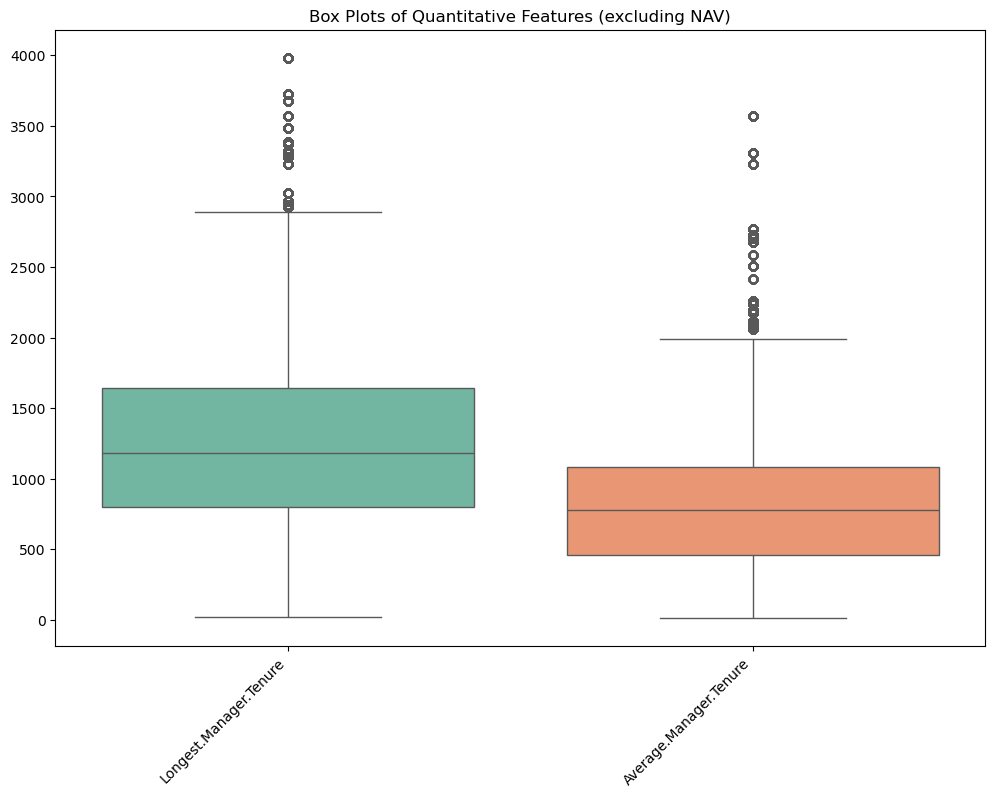

In [12]:
# Outlying observations
# Select only quantitative features excluding 'NAV (USD)'
quant_features1 = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure']]

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Create box plots using seaborn
sns.boxplot(data=quant_features1, palette='Set2')

# Set plot title
plt.title('Box Plots of Quantitative Features (excluding NAV)')

# Set x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()

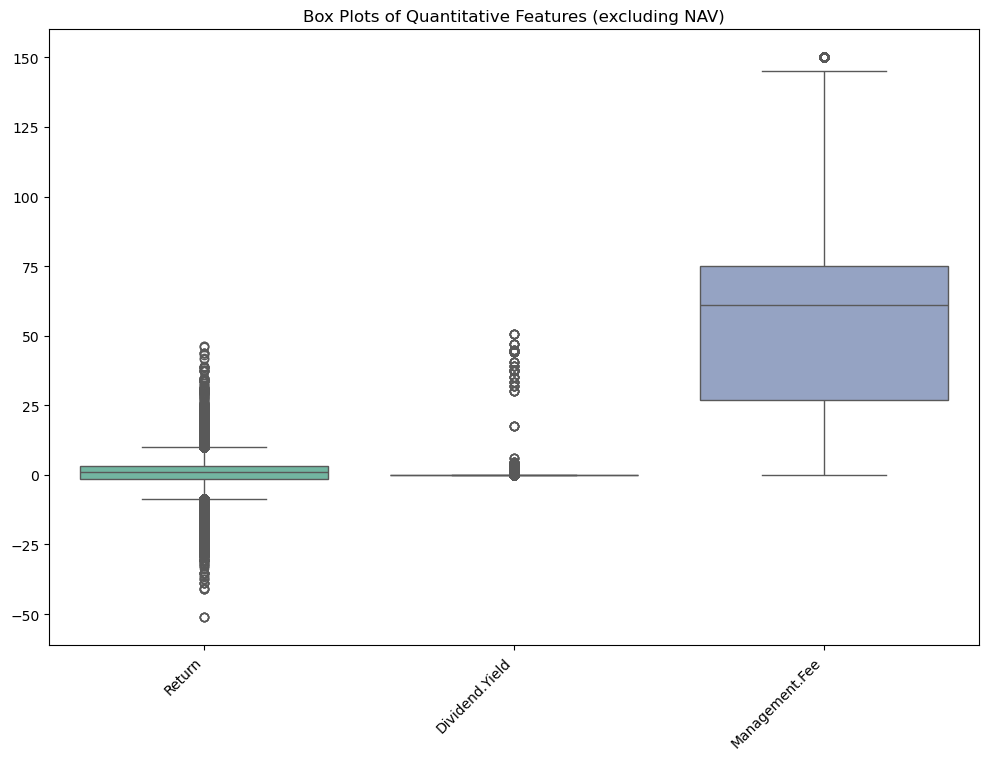

In [13]:
quant_features2 = data[['Return', 'Dividend.Yield', 'Management.Fee']]

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Create box plots using seaborn
sns.boxplot(data=quant_features2, palette='Set2')

# Set plot title
plt.title('Box Plots of Quantitative Features (excluding NAV)')

# Set x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()

In [6]:
# Load FF5 Features DataFrame
data_FF5 = pd.read_csv(r'./F-F_Research_Data_5_Factors_2x3.csv')

# Set the 'Date' column as the index
data_FF5.set_index('Date', inplace=True)

# Display the first 5 rows of the FF5 Features DataFrame
print("\nFF5 Features:")
print(data_FF5.head(5))


FF5 Features:
          Mkt-RF       SMB       HML       RMW       CMA        RF
Date                                                              
196307     -0.39     -0.41     -0.97      0.68     -1.18      0.27
196308      5.07     -0.80      1.80      0.36     -0.35      0.25
196309     -1.57     -0.52      0.13     -0.71      0.29      0.27
196310      2.53     -1.39     -0.10      2.80     -2.01      0.29
196311     -0.85     -0.88      1.75     -0.51      2.24      0.27


In [7]:
# Inio correct form 
data_MOM['MOM'] = data_MOM['Mom   ']
data_MOM.drop('Mom   ', inplace = True, axis =1)

Create the 'MOM' column in the 'data' dataframe

In [8]:
# Create the 'MOM' column in the 'data' dataframe
data['MOM'] = 0  # You can replace 0 with any default value

# Loop to assign corresponding values
for index, row in data_MOM.iterrows():
    date = index  # Use the index directly since it's the 'Date' in this case
    mom_value = row['MOM']
    
    # Find the corresponding index in the 'data' dataframe
    data_index = data[data.index == date].index
    
    # Assign the value of 'MOM_Value' to 'MOM' in the 'data' dataframe
    if len(data_index) > 0:
        data.at[data_index[0], 'MOM'] = mom_value

# Display the resulting dataframe
print(data)

                                   Fund.Name Ticker Global.Broad.Category  \
Date                                                                        
200704  MFS International Intrinsic Value R6  MINJX                Equity   
200706  MFS International Intrinsic Value R6  MINJX                Equity   
200707  MFS International Intrinsic Value R6  MINJX                Equity   
200707  MFS International Intrinsic Value R6  MINJX                Equity   
200709  MFS International Intrinsic Value R6  MINJX                Equity   
...                                      ...    ...                   ...   
202309           Columbia Large Cap Growth C  LEGCX                Equity   
202309                 PGIM Jennison Value C  PEICX                Equity   
202309           Columbia Large Cap Growth E  CLGEX                Equity   
202309  PGIM Quant Solutions Large-Cap Val A  SUVAX                Equity   
202309                 KL Allocation Advisor  GAVAX            Allocation   

Create columns in the 'data' dataframe for FF5 factors.

In [9]:
# Create columns in the 'data' dataframe for FF5 factors
# You can replace 0 with any default value
data['Mkt-RF'] = 0    
data['SMB'] = 0    
data['HML'] = 0    
data['RMW'] = 0    
data['CMA'] = 0   
data['RF'] = 0    

# Loop to assign corresponding values
for index, row in data_FF5.iterrows():
    date = index  # Use the index directly since it's the 'Date' in this case
    
    # Find the corresponding index in the 'data' dataframe
    data_index = data[data.index == date].index
    
    # Assign the value to the respective columns in the 'data' dataframe
    if len(data_index) > 0:
        data.at[data_index[0], 'Mkt-RF'] = row['Mkt-RF']
        data.at[data_index[0], 'SMB'] = row['SMB']
        data.at[data_index[0], 'HML'] = row['HML']
        data.at[data_index[0], 'RMW'] = row['RMW']
        data.at[data_index[0], 'CMA'] = row['CMA']
        data.at[data_index[0], 'RF'] = row['RF']

In [10]:
data['Inception.Date'] = pd.to_datetime(data['Inception.Date'], format='%Y.%m')

# Create a new column 'Inception.Year' to hold the year part
data['Inception.Year'] = data['Inception.Date'].dt.year

In [11]:
data['Age.Fund'] = data['date'] - data['Inception.Year']
data.head(3)

,Fund.Name,Ticker,Global.Broad.Category,Global.Category,US.Category,Firm.Name,Inception.Date,Longest.Manager.Tenure,Average.Manager.Tenure,Return,...,date,MOM,Mkt-RF,SMB,HML,RMW,CMA,RF,Inception.Year,Age.Fund
Date,,,,,,,,,,,,,,,,,,,,,
200704,MFS International Intrinsic Value R6,MINJX,Equity,Global Equity Large Cap,International Equity,MFS,2006-05-01,1492,929,1.74,...,2007.333333,-0.24,3.49,-2.04,-1.45,1.15,1.03,0.44,2006,1.333333
200706,MFS International Intrinsic Value R6,MINJX,Equity,Global Equity Large Cap,International Equity,MFS,2006-05-01,1492,929,0.31,...,2007.416667,0.51,-1.96,0.74,-1.05,0.53,0.08,0.40,2006,1.416667
200707,MFS International Intrinsic Value R6,MINJX,Equity,Global Equity Large Cap,International Equity,MFS,2006-05-01,1492,929,-2.10,...,2007.500000,2.94,-3.73,-2.99,-3.71,0.20,-1.13,0.40,2006,1.500000


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 330403 entries, 200704 to 202309
Data columns (total 23 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Fund.Name               330403 non-null  object        
 1   Ticker                  330403 non-null  object        
 2   Global.Broad.Category   330403 non-null  object        
 3   Global.Category         330403 non-null  object        
 4   US.Category             330403 non-null  object        
 5   Firm.Name               330403 non-null  object        
 6   Inception.Date          330403 non-null  datetime64[ns]
 7   Longest.Manager.Tenure  330403 non-null  int64         
 8   Average.Manager.Tenure  330403 non-null  int64         
 9   Return                  330403 non-null  float64       
 10  Dividend.Yield          330403 non-null  float64       
 11  Management.Fee          330403 non-null  int64         
 12  NAV (USD)               330403

In [12]:
# Convert columns to numeric
data['MOM'] = pd.to_numeric(data['MOM'], errors='coerce')
data['Mkt-RF'] = pd.to_numeric(data['Mkt-RF'], errors='coerce')
data['SMB'] = pd.to_numeric(data['SMB'], errors='coerce')
data['HML'] = pd.to_numeric(data['HML'], errors='coerce')
data['RMW'] = pd.to_numeric(data['RMW'], errors='coerce')
data['CMA'] = pd.to_numeric(data['CMA'], errors='coerce')
data['RF'] = pd.to_numeric(data['RF'], errors='coerce')

# Display summary
summary = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
                'Management.Fee', 'NAV (USD)', 'date', 'MOM', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
                'Inception.Year', 'Age.Fund']].describe()
data.drop('Inception.Year', axis =1, inplace=True)
summary

,Longest.Manager.Tenure,Average.Manager.Tenure,Return,Dividend.Yield,Management.Fee,NAV (USD),date,MOM,Mkt-RF,SMB,HML,RMW,CMA,Inception.Year,Age.Fund
count,330403.000000,330403.000000,330403.000000,330403.000000,330403.000000,3.304030e+05,330403.000000,330403.000000,330403.000000,330403.000000,330403.000000,330403.000000,330403.000000,330403.00000,330403.000000
mean,1247.204895,819.467668,0.733082,0.032545,53.720662,7.554982e+08,2019.067157,-0.223493,1.307443,-0.467329,0.168259,0.475730,0.271900,2005.27346,13.793697
std,666.886404,442.264585,4.619396,0.679381,29.987682,6.910824e+09,2.799029,4.190731,4.869086,2.911806,3.822849,1.954072,2.648009,8.15338,8.571000
min,17.000000,14.000000,-51.190000,0.000000,0.000000,0.000000e+00,2007.333333,-34.300000,-17.230000,-8.280000,-13.870000,-3.880000,-6.830000,1924.00000,-0.333333
25%,800.000000,458.000000,-1.540000,0.010000,27.000000,1.036534e+07,2016.916667,-2.600000,-0.110000,-2.700000,-1.810000,-0.800000,-1.180000,2001.00000,7.833333
50%,1183.000000,775.000000,0.950000,0.020000,61.000000,7.009408e+07,2019.166667,0.150000,1.540000,-0.800000,-0.260000,0.630000,0.000000,2006.00000,12.333333
75%,1642.000000,1083.000000,3.100000,0.020000,75.000000,3.745063e+08,2021.416667,2.890000,3.970000,1.820000,2.150000,1.610000,1.300000,2011.00000,18.166667
max,3983.000000,3567.000000,46.150000,50.480000,150.000000,5.937839e+11,2023.666667,12.750000,13.650000,7.130000,12.750000,6.360000,7.720000,2015.00000,99.666667


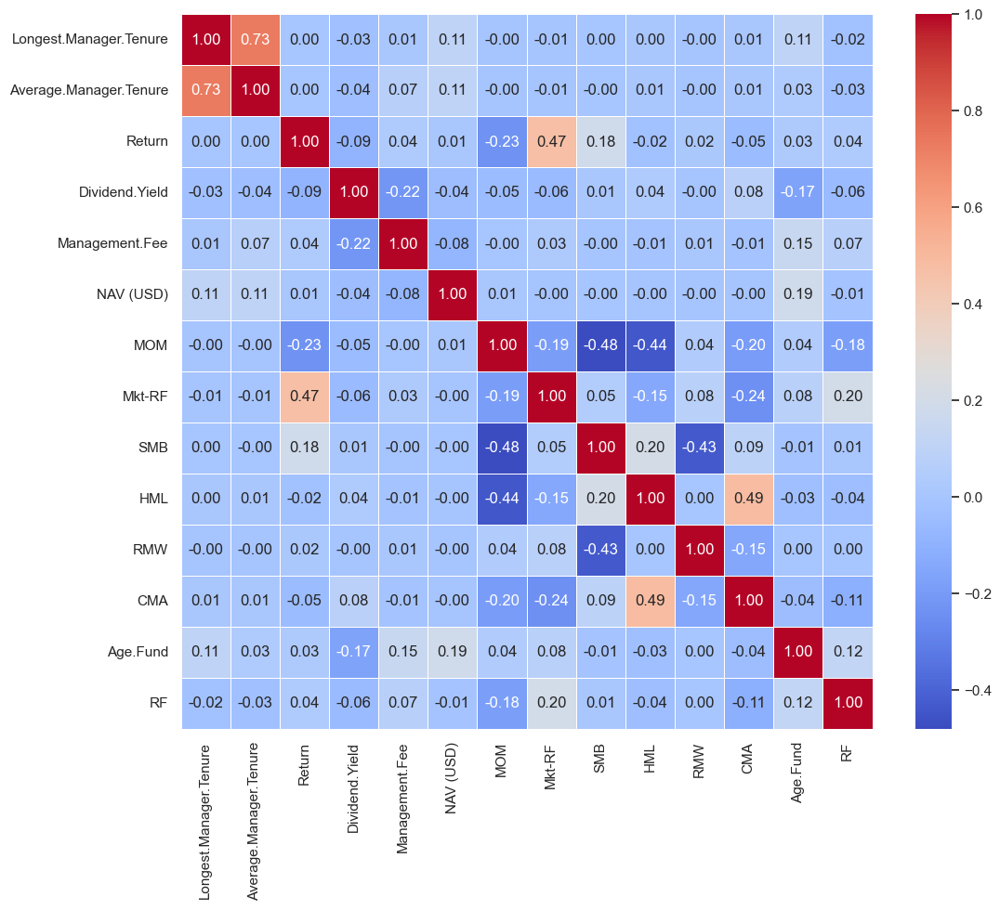

In [48]:
# Select only quantitative features for the correlation matrix
quant_features = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
                       'Management.Fee', 'NAV (USD)', 'MOM', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
                        'Age.Fund','RF']]

# Compute the correlation matrix
correlation_matrix = quant_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Show the plot
plt.show()

Engineering new features namely : Age => duration of the investment , $R^2$-score

In [ ]:
quant_features = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
                       'Management.Fee', 'NAV (USD)', 'MOM', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
                        'Age.Fund','RF']]

# Create a grid of subplots dynamically based on the number of quantitative features
num_features = quant_features.shape[1]
num_rows = (num_features // 2) + (num_features % 2)  # Ensure enough rows for all features
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(12, num_rows * 4))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through each quantitative feature and plot it over time
for i, (col, ax) in enumerate(zip(quant_features.columns, axes)):
    sns.lineplot(x=data.index, y=quant_features[col], ax=ax)
    ax.set_title(f'{col} Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel(col)
    
    ax.xaxis.set_major_locator(plt.MaxNLocator(6))  # Set the maximum number of ticks to 6 for visibility
    ax.tick_params(axis='x', rotation=45)  # Rotate x-axis tick labels for better readability
    # Add grid behind the subplot
    ax.grid(True)

# Remove any empty subplots
for i in range(num_features, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


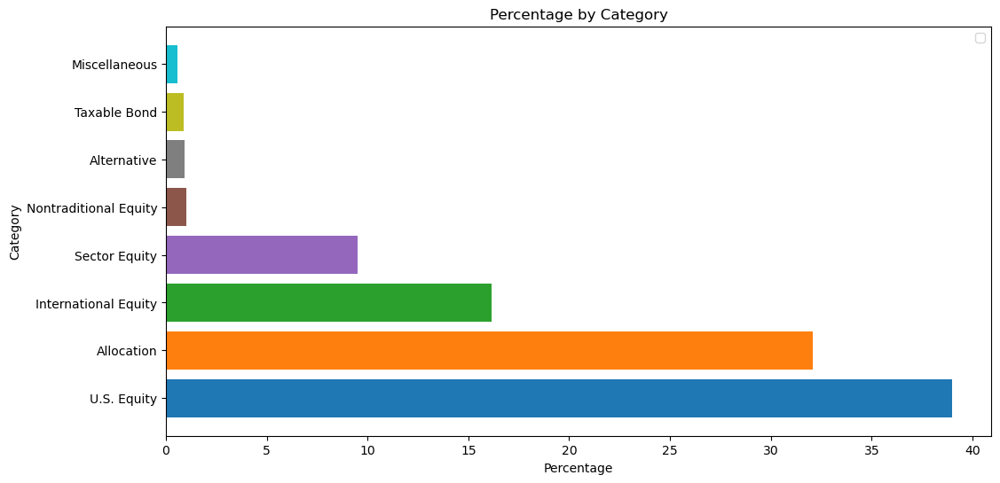

In [15]:
# Assuming 'data' is your DataFrame with a column 'US.Category'
category_counts = data['US.Category'].value_counts()
total_samples = len(data['US.Category'])
category_percentages = (category_counts / total_samples) * 100

# Choose a color map and create a list of colors based on the number of categories
colors = plt.cm.get_cmap('tab10', len(category_counts))

# Create a horizontal bar plot
plt.figure(figsize=(12, 6))
for i, (category, percentage) in enumerate(category_percentages.items()):
    plt.barh(category, percentage, color=colors(i))

# Set plot labels and title
plt.xlabel('Percentage')
plt.ylabel('Category')
plt.title('Percentage by Category')

plt.legend()
plt.show()

# OUTLYING OBSERVATIONS
---------------------------------------------------------------------------
Dealing outliers: This box plot highlghts the presence of outlying observations in dataset.We must delete as follows:
-------

Interquartile Range (IQR):
IQR = Q3 - Q1
where Q3 is the third quartile (75th percentile) and Q1 is the first quartile (25th percentile).

Upper Bound:
Upper Bound = Q3 + 1.5 IQR
Points above this threshold are considered as potential outliers.

Lower Bound:
Lower Bound = Q1 - 1.5 IQR
Points below this threshold are considered as potential outliers.


In [16]:
# Dealing outlying observations on the basis of the Five Tuckey's summary
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
for column in numerical_cols:
    IQR = data[column].quantile(0.75) - data[column].quantile(0.25)
    upper = data[column].quantile(0.75) + (IQR * 1.5)
    lower = data[column].quantile(0.25) - (IQR * 1.5)

    data = data[(data[column] <= upper) & (data[column] >= lower)]
print(data.info())  # 177033  observations right now

<class 'pandas.core.frame.DataFrame'>
Index: 177033 entries, 201001 to 202203
Data columns (total 22 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Fund.Name               177033 non-null  object        
 1   Ticker                  177033 non-null  object        
 2   Global.Broad.Category   177033 non-null  object        
 3   Global.Category         177033 non-null  object        
 4   US.Category             177033 non-null  object        
 5   Firm.Name               177033 non-null  object        
 6   Inception.Date          177033 non-null  datetime64[ns]
 7   Longest.Manager.Tenure  177033 non-null  int64         
 8   Average.Manager.Tenure  177033 non-null  int64         
 9   Return                  177033 non-null  float64       
 10  Dividend.Yield          177033 non-null  float64       
 11  Management.Fee          177033 non-null  int64         
 12  NAV (USD)               177033

Typically the overall features is not correlated, except for Averagae.Manager.Teneure and Longest.Manager.Tenure variable pair as expected.

# Computing Alpha
----------------------------------------------

The monthly realized alpha for the $𝑖^{th}$ share
class in the $𝑚^{th}$ month $\alpha_{i,m} $: 

$\alpha_{i,m} = r_{i,m} - \hat{\beta}_{MKT, i, m} MKT_m - \hat{\beta}_{SMB, i, m} SMB_m - \hat{\beta}_{HML, i, m} HML_m - \hat{\beta}_{RMW, i, m} RMW_m - \hat{\beta}_{CMA, i, m} CMA_m - \hat{\beta}_{MOM, i, m} MOM_m
$.

Engineering others variables from the auto-regressive regression : 

In [17]:
import statsmodels.regression.linear_model as smf
from statsmodels.tools.tools import add_constant

list_tickers = data['Ticker'].tolist()

In [18]:
data = sm.add_constant(data)  # Add constant outside the loop

data['Excess_Return'] = data['Return'] - data['RF']     # Excess return
alphas = []
betasMOM = []
betasMkt = []
betasSMB = []
betasHML = []
betasRMW = []
betasCMA = []
list_tickers2 = []

for tick in tqdm.tqdm(list_tickers):
    list_tickers2.append(tick)

    x = data[data.Ticker == tick][['const', 'MOM', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA']]
    y = data[data.Ticker == tick]['Excess_Return']

    temp = sm.OLS(y, x, missing='drop').fit(cov_type='HC2')

    alphas.append(temp.params['const'])
    betasMOM.append(temp.params['MOM'])
    betasMkt.append(temp.params['Mkt-RF'])
    betasSMB.append(temp.params['SMB'])
    betasHML.append(temp.params['HML'])
    betasRMW.append(temp.params['RMW'])
    betasCMA.append(temp.params['CMA'])

coefficients = pd.DataFrame(columns=['TICKER', 'alpha', 'betasMOM', 'betasMkt', 'betasSMB', 'betasHML', 'betasRMW', 'betasCMA'])
coefficients['TICKER'] = list_tickers2
coefficients['alpha'] = alphas
coefficients['betasMOM'] = betasMOM
coefficients['betasMkt'] = betasMkt
coefficients['betasSMB'] = betasSMB
coefficients['betasHML'] = betasHML
coefficients['betasRMW'] = betasRMW
coefficients['betasCMA'] = betasCMA

  1%|▍                                                                            | 895/177033 [00:15<49:47, 58.95it/s]C:\Users\Eto\miniconda3\lib\site-packages\statsmodels\regression\linear_model.py:1971: RuntimeWarning: divide by zero encountered in true_divide
  self.het_scale = self.wresid**2/(1-h)
  1%|▍                                                                            | 938/177033 [00:16<49:46, 58.96it/s]C:\Users\Eto\miniconda3\lib\site-packages\statsmodels\regression\linear_model.py:1971: RuntimeWarning: divide by zero encountered in true_divide
  self.het_scale = self.wresid**2/(1-h)
  1%|▍                                                                           | 1147/177033 [00:19<49:34, 59.14it/s]C:\Users\Eto\miniconda3\lib\site-packages\statsmodels\regression\linear_model.py:1971: RuntimeWarning: divide by zero encountered in true_divide
  self.het_scale = self.wresid**2/(1-h)
  1%|▌                                                                           | 1339/

In [19]:
coefficients.tail(3)

,TICKER,alpha,betasMOM,betasMkt,betasSMB,betasHML,betasRMW,betasCMA
177030,RSOOX,1.315719,-0.211957,0.334838,-0.170791,-0.126121,-0.372211,0.043768
177031,DREGX,1.038833,0.694453,0.497520,2.438048,-0.744209,1.872487,0.897456
177032,CDOYX,1.177734,-0.360529,0.259619,-0.406177,-0.158757,-0.606099,-0.134567


In [20]:
data_ = data.copy()
data.reset_index('Date',inplace =True)

# Drop the 'Date' column
data = data.drop('Date', axis=1)
data = data.drop('Excess_Return', axis=1)
data = data.drop('const', axis=1)
data.tail(3)

,Fund.Name,Ticker,Global.Broad.Category,Global.Category,US.Category,Firm.Name,Inception.Date,Longest.Manager.Tenure,Average.Manager.Tenure,Return,...,NAV (USD),date,MOM,Mkt-RF,SMB,HML,RMW,CMA,RF,Age.Fund
177030,Columbia Dividend Opportunity R,RSOOX,Equity,US Equity Large Cap Value,U.S. Equity,Columbia Threadneedle,2008-08-01,542,461,2.88,...,39721660,2022.166667,3.01,3.05,-2.17,-1.81,-1.53,3.14,0.01,14.166667
177031,Driehaus Emerging Markets Growth Inv,DREGX,Equity,Global Emerging Markets Equity,International Equity,Driehaus,1997-12-31,1617,1367,-1.57,...,744545186,2022.166667,3.01,3.05,-2.17,-1.81,-1.53,3.14,0.01,25.166667
177032,Columbia Dividend Opportunity Inst3,CDOYX,Equity,US Equity Large Cap Value,U.S. Equity,Columbia Threadneedle,2012-11-08,542,461,2.94,...,156087806,2022.166667,3.01,3.05,-2.17,-1.81,-1.53,3.14,0.01,10.166667


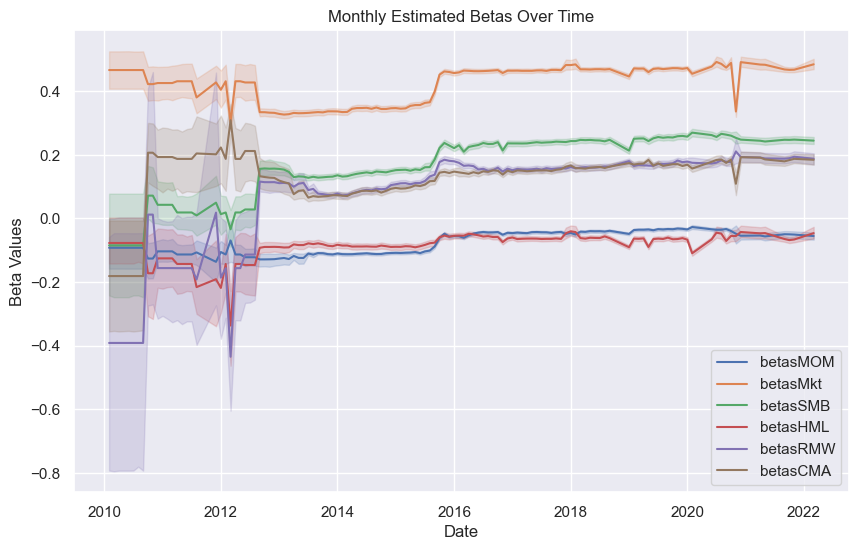

In [25]:
betas_colmuns = ['betasMOM', 'betasMkt', 'betasSMB', 'betasHML', 'betasRMW', 'betasCMA']
# Set Seaborn style
sns.set(style="darkgrid")

# Plotting
plt.figure(figsize=(10, 6))

# Plot each column
for column in betas_colmuns:
        sns.lineplot(x=data['date'], y=column, data=coefficients, label=column)

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Beta Values')
plt.title('Monthly Estimated Betas Over Time')

# Show the legend
plt.legend(loc='lower right')

# Show the plot
plt.show()

In [26]:
data = pd.merge(data, coefficients, left_index=True, right_index=True)

In [27]:
data.set_index('date', inplace =True)
data.head(3)

,Fund.Name,Ticker,Global.Broad.Category,Global.Category,US.Category,Firm.Name,Inception.Date,Longest.Manager.Tenure,Average.Manager.Tenure,Return,...,RF,Age.Fund,TICKER,alpha,betasMOM,betasMkt,betasSMB,betasHML,betasRMW,betasCMA
date,,,,,,,,,,,,,,,,,,,,,
2010.083333,MFS International Intrinsic Value R6,MINJX,Equity,Global Equity Large Cap,International Equity,MFS,2006-05-01,1492,929,-0.31,...,0.0,4.083333,MINJX,0.309034,0.095318,0.523363,-0.207990,-0.062197,-1.181587,-0.408462
2010.083333,MFS International Intrinsic Value R3,MINGX,Equity,Global Equity Large Cap,International Equity,MFS,2008-10-01,1492,929,-0.32,...,0.0,2.083333,MINGX,0.401507,-0.102984,0.516834,-0.278298,-0.091624,-0.460742,-0.124174
2010.083333,MFS International Intrinsic Value R4,MINHX,Equity,Global Equity Large Cap,International Equity,MFS,2008-10-01,1492,929,-0.27,...,0.0,2.083333,MINHX,0.435718,-0.116882,0.531960,-0.236565,0.077149,-0.397751,-0.417573


In [28]:
#data.to_csv('data_ASMF_project.csv') 

In [2]:
# Used as a shortcut to access the tuned dataset.
#data = pd.read_csv(r'./data_ASMF_project.csv')   

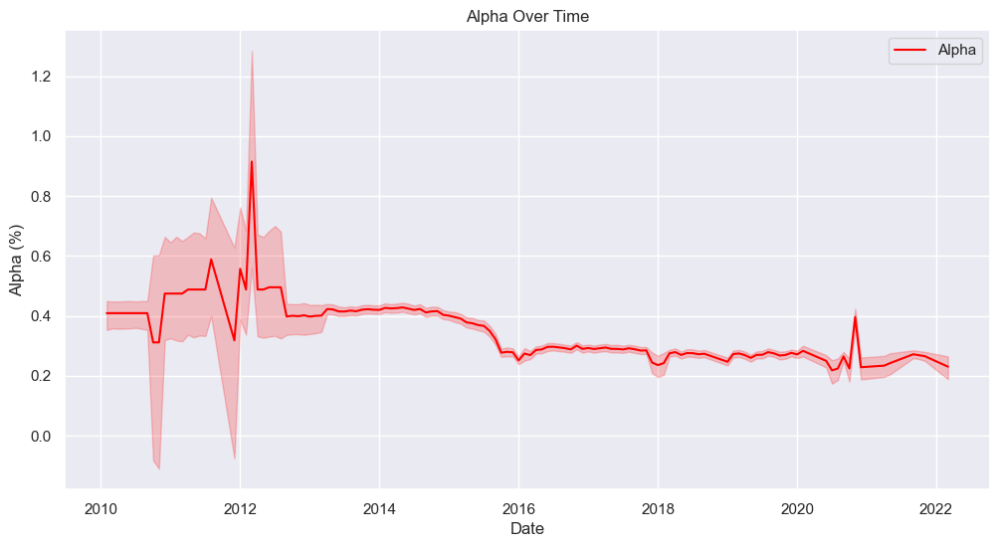

In [4]:
# Plotting alpha over time with a different grid style and red color
sns.set(style='darkgrid')  # Use 'darkgrid' for a different grid style

# Assuming 'alpha' is a column in your 'data' DataFrame
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x=data.index, y='alpha', label='Alpha', color='red')  # Set line color to red
plt.title('Alpha Over Time')
plt.xlabel('Date')
plt.ylabel('Alpha (%)')
plt.legend()
plt.show()

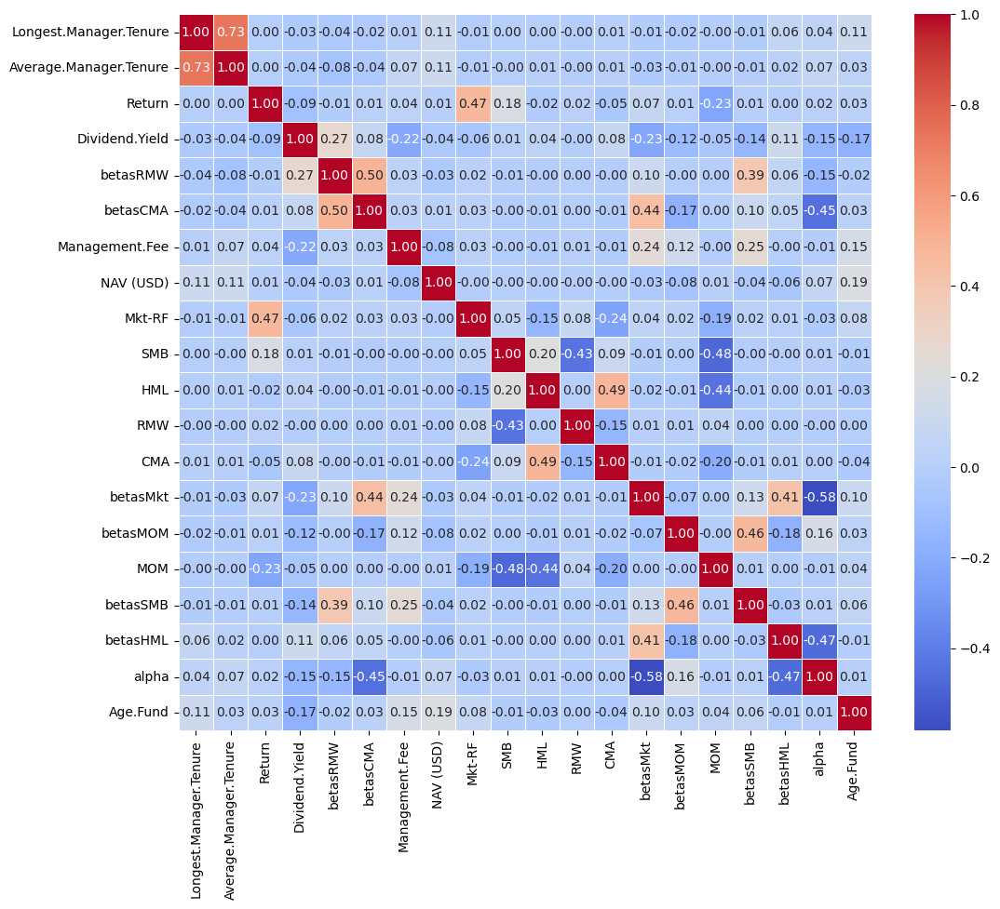

In [5]:
# Select only quantitative features for the correlation matrix
quant_features = data[['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
'betasRMW','betasCMA','Management.Fee', 'NAV (USD)', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
'betasMkt','betasMOM','MOM','betasSMB','betasHML','alpha','Age.Fund']]

# Compute the correlation matrix
correlation_matrix = quant_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Show the plot
plt.show()

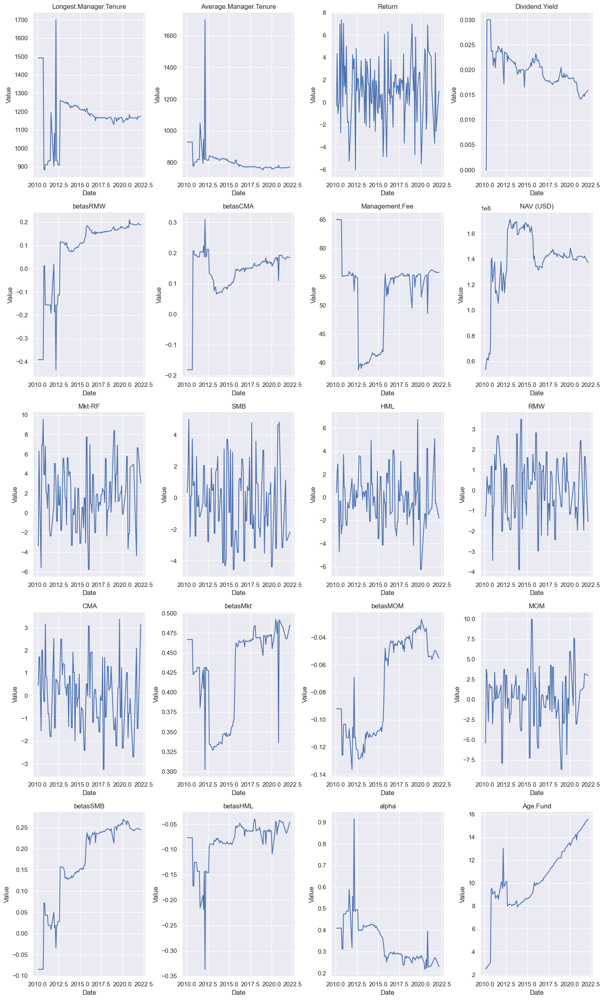

In [7]:
# Set Seaborn darkgrid style
sns.set(style="darkgrid")

# Determine the number of rows and columns dynamically
num_features = len(quant_features.columns)
rows = int(np.ceil(num_features / 4))
cols = min(4, num_features)

# Create subplots for each variable
plt.figure(figsize=(15, 5 * rows))
for i, feature in enumerate(quant_features.columns):
    plt.subplot(rows, cols, i + 1)
    sns.lineplot(x=data['date'], y=feature, data=data, errorbar=None)
    plt.title(feature)
    plt.xlabel('Date')
    plt.ylabel('Value')

plt.tight_layout()
plt.show()

# Variables selection via LASSO
------------------------------------------------------------------------

In [5]:
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler

# 'alpha' is the target variable

# Separate features and target
X = quant_features.drop('alpha', axis=1)  # Assuming 'alpha' is the target variable
y = quant_features['alpha']

# Determine the split index for 80% training data
split_index = int(0.8 * len(X))

# Split the data into training and testing sets based on index
X_train = X.iloc[:split_index, :]
X_test = X.iloc[split_index:, :]
y_train = y.iloc[:split_index]
y_test = y.iloc[split_index:]

# Standardize features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [11]:
# Lasso path (6 alpha values to test)
my_alphas = np.array([0.0001,0.1,0.0003, 0.0002, 0.25, 0.3])

# Getting the corresponding coefficient values
from sklearn.linear_model import lasso_path
lambda_for_path, coefs_lasso, _ = lasso_path(X_train_scaled,y_train,alphas=my_alphas)

# Dimension of the matrix coefficients
print(coefs_lasso.shape)

(19, 6)


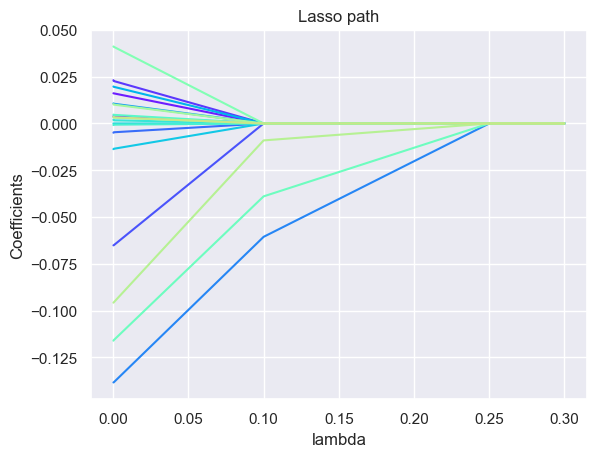

In [12]:
import matplotlib.cm as cm

colors = cm.rainbow(np.linspace(0,1,len(data.columns) - 1))
# Plot lasso path
for i in range(coefs_lasso.shape[0]):
 plt.plot(lambda_for_path,coefs_lasso[i,:],c=colors[i])

plt.xlabel('lambda')
plt.ylabel('Coefficients')
plt.title('Lasso path')
plt.show()

In [13]:
# Number of non-zero coefs. for each lambda
nbNonZero = np.apply_along_axis(func1d=np.count_nonzero, arr=coefs_lasso, axis=0)
print(pd.DataFrame({'lambda': lambda_for_path, 'Nb non-zero coefs': nbNonZero}))

   lambda  Nb non-zero coefs
0  0.3000                  0
1  0.2500                  0
2  0.1000                  3
3  0.0003                 18
4  0.0002                 18
5  0.0001                 19


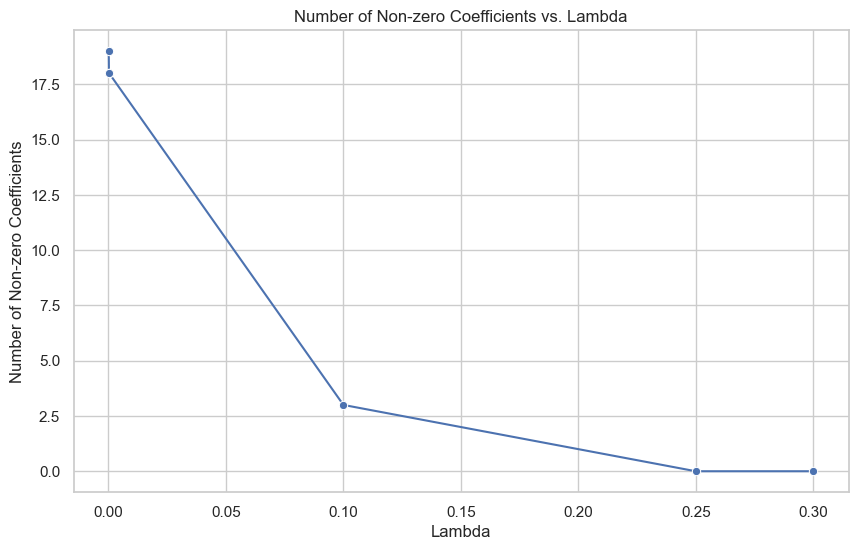

In [14]:
# Under graphic form
sns.set(style="whitegrid")

# Plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x=lambda_for_path, y=nbNonZero, marker='o')

# Customize plot
plt.xlabel('Lambda')
plt.ylabel('Number of Non-zero Coefficients')
plt.title('Number of Non-zero Coefficients vs. Lambda')

# Show the plot
plt.show()

Optimal lambda: 0.0001
Optimal Coefficients: [ 5.73652293e-05  9.77583031e-05  9.73387512e-03  4.37968469e+00
 -9.98074243e-02 -6.79744560e-01  1.11242878e-03  1.30355951e-10
 -5.28104302e-04 -2.40269485e-03  1.81889971e-03 -1.12416856e-03
  1.70025166e-03 -1.46941172e-01  1.20515690e-01  3.17348712e-03
  2.20275801e-01 -6.81097514e-01  5.53438943e-03]


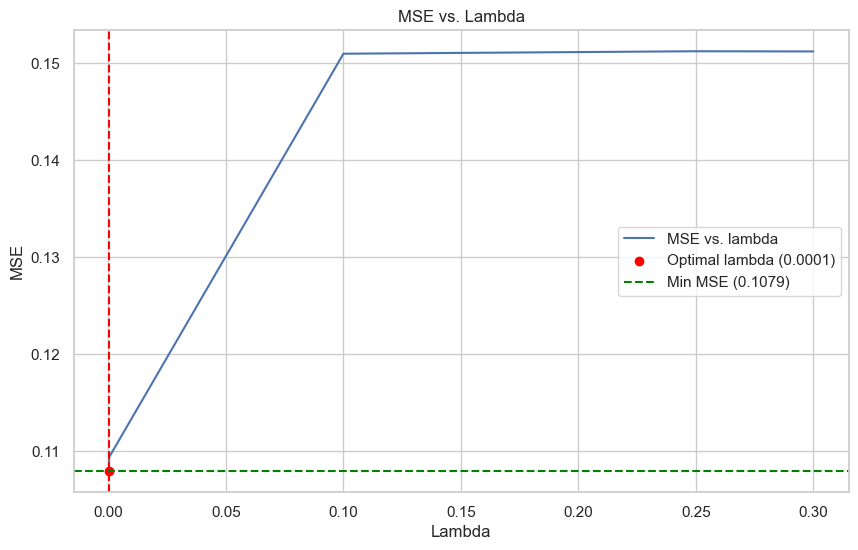

In [15]:
# Grid search for selecting the best lambda value according to the MSE
my_alphas = np.array([0.0001, 0.1, 0.0003, 0.0002, 0.25, 0.3])

# Specify TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Instantiate LassoCV with specified alphas and TimeSeriesSplit
lcv = LassoCV(alphas=my_alphas, cv=tscv, fit_intercept=False)
lcv.fit(X_train, y_train)

# Obtain the optimal alpha selected by LassoCV
optimal_lambda = lcv.alpha_
print("Optimal lambda:", optimal_lambda)

# Get the coefficients for the optimal alpha
optimal_coefs = lcv.coef_
print("Optimal Coefficients:", optimal_coefs)

# Average MSE in cross-validation for each alpha
avg_mse = np.mean(lcv.mse_path_, axis=1)

# Alphas vs. MSE in cross-validation
df_mse = pd.DataFrame({'alpha': lcv.alphas_, 'MSE': avg_mse})

# Plotting using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='alpha', y='MSE', data=df_mse, label='MSE vs. lambda')
plt.scatter(optimal_lambda, np.min(avg_mse), color='red', marker='o', label=f'Optimal lambda ({optimal_lambda:.4f})')
plt.axvline(x=optimal_lambda, color='red', linestyle='--')

# Extend the dashed line to the minimum MSE
min_mse = np.min(avg_mse)
plt.axhline(y=min_mse, color='green', linestyle='--', label=f'Min MSE ({min_mse:.4f})')

plt.xlabel('Lambda')
plt.ylabel('MSE')
plt.title('MSE vs. Lambda')
plt.legend()
plt.show()

In [16]:
# Variable names
nom_var = X_train.columns

# Displaying coefficients for lambda = 0.0001
df_opt = pd.DataFrame({'Variables':nom_var,'Coefficients':optimal_coefs})
print(df_opt)
# Filter out coefficients with value 0
nonzero_coef_df = df_opt[df_opt['Coefficients'] != 0]
print()
# Display the filtered DataFrame
print(nonzero_coef_df)# 19 quantitative variables

                 Variables  Coefficients
0   Longest.Manager.Tenure  5.736523e-05
1   Average.Manager.Tenure  9.775830e-05
2                   Return  9.733875e-03
3           Dividend.Yield  4.379685e+00
4                 betasRMW -9.980742e-02
5                 betasCMA -6.797446e-01
6           Management.Fee  1.112429e-03
7                NAV (USD)  1.303560e-10
8                   Mkt-RF -5.281043e-04
9                      SMB -2.402695e-03
10                     HML  1.818900e-03
11                     RMW -1.124169e-03
12                     CMA  1.700252e-03
13                betasMkt -1.469412e-01
14                betasMOM  1.205157e-01
15                     MOM  3.173487e-03
16                betasSMB  2.202758e-01
17                betasHML -6.810975e-01
18                Age.Fund  5.534389e-03

                 Variables  Coefficients
0   Longest.Manager.Tenure  5.736523e-05
1   Average.Manager.Tenure  9.775830e-05
2                   Return  9.733875e-03
3           Div

None of the estimated coefficients of the variables, is set to zero. Therefore all the quantitative variables will be use when modelling.

# II. Modelling
---------------------------------------------------------------------------

Performance-evaluation methodology: By inspiring from Kaniel's and al's reference, the process for training models and assessing their performances are as follows:
- train the model over the training set (60%);
- evaluate it over the validation set (20%) (helpful for detecting overfitting or underfitting);
- then train the model again, but now over the training set + validation set;
- finally evaluate it over the test set (20%).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm

import statsmodels.api as sm
from sklearn.linear_model import ElasticNet
from IPython.display import Image, display
from sklearn.preprocessing import StandardScaler
from statsmodels.tools.tools import add_constant
from numpy.core.multiarray import result_type
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from IPython.display import Image, display
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score
import xgboost as xgb
import shap
import torch
import torch.nn as nn
import torch.optim as optim

In [18]:
quant_features.info() # 20 quantitative features 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177033 entries, 0 to 177032
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Longest.Manager.Tenure  177033 non-null  int64  
 1   Average.Manager.Tenure  177033 non-null  int64  
 2   Return                  177033 non-null  float64
 3   Dividend.Yield          177033 non-null  float64
 4   betasRMW                177033 non-null  float64
 5   betasCMA                177033 non-null  float64
 6   Management.Fee          177033 non-null  int64  
 7   NAV (USD)               177033 non-null  int64  
 8   Mkt-RF                  177033 non-null  float64
 9   SMB                     177033 non-null  float64
 10  HML                     177033 non-null  float64
 11  RMW                     177033 non-null  float64
 12  CMA                     177033 non-null  float64
 13  betasMkt                177033 non-null  float64
 14  betasMOM            

In [7]:
# Separate features and target
X = quant_features.drop('alpha', axis=1)  # 'alpha' is the target variable
y = quant_features['alpha']

# Determine the split indices for 60% training, 20% validation, and 20% test
train_index = int(0.6 * len(X))
validation_index = int(0.8 * len(X))

# Split the data into training, validation, and test sets based on indices
X_train = X.iloc[:train_index, :]
X_validation = X.iloc[train_index:validation_index, :]
X_test = X.iloc[validation_index:, :]
y_train = y.iloc[:train_index]
y_validation = y.iloc[train_index:validation_index]
y_test = y.iloc[validation_index:]

# Standardize features using StandardScaler
scaler = StandardScaler()
X_train_scaled_array = scaler.fit_transform(X_train)
X_validation_scaled_array = scaler.transform(X_validation)
X_test_scaled_array = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames with column names
X_train_scaled = pd.DataFrame(X_train_scaled_array, columns=X_train.columns)
X_validation_scaled = pd.DataFrame(X_validation_scaled_array, columns=X_validation.columns)
X_test_scaled = pd.DataFrame(X_test_scaled_array, columns=X_test.columns)

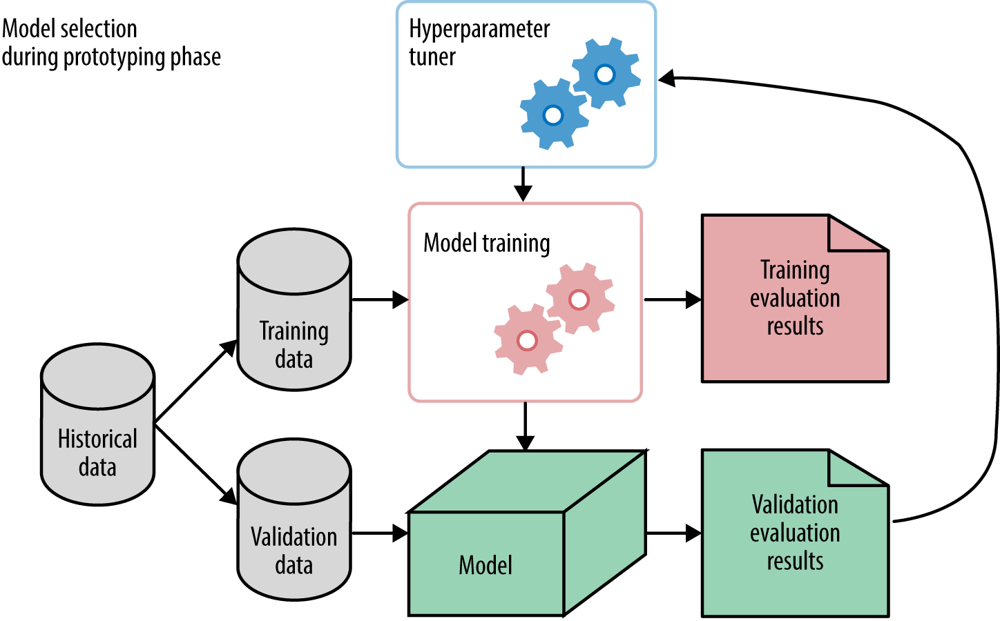

In [118]:
display(Image(filename=r'./Process.png'))

# Selection and optimization of model hyperparameters
-----------------------------------------------------------------------

# Benchmark model : Linear Regression model

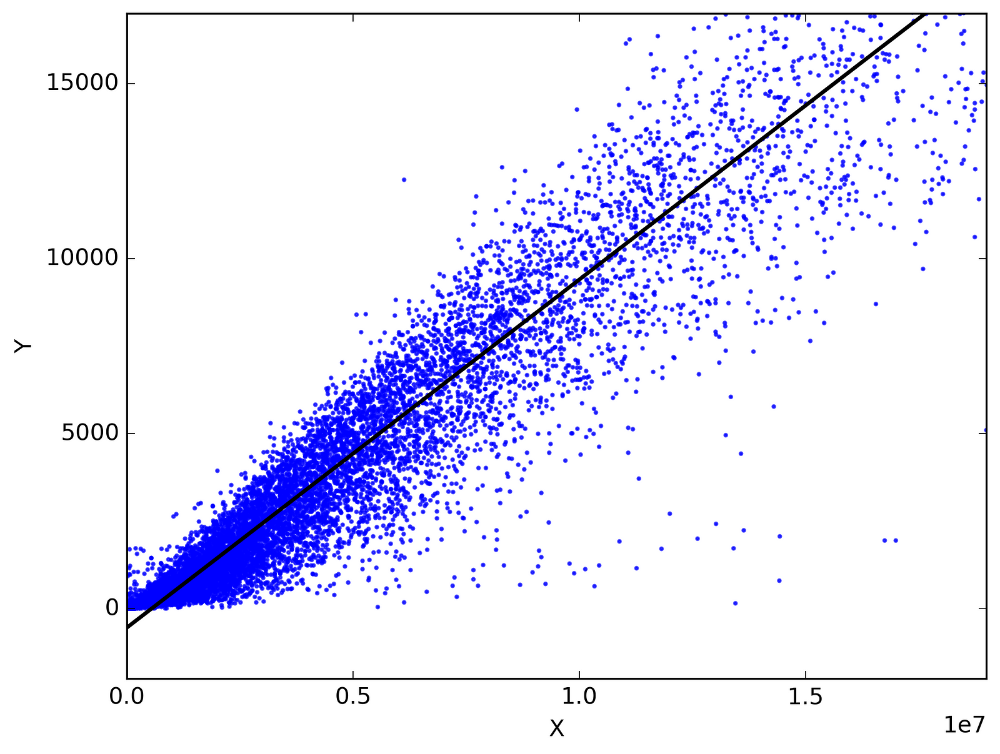

In [8]:
display(Image(filename=r'./Linear_Regression.png'))

In [16]:
# Benchmark : Linear regression

# Separate features and target
X = quant_features.drop('alpha', axis=1)
y = quant_features['alpha']

# Standardize features using StandardScaler
scaler = StandardScaler()
X_scaled_array = scaler.fit_transform(X)

# Convert scaled array back to DataFrame with column names
X_scaled = pd.DataFrame(X_scaled_array, columns=X.columns)

# Add a constant term to the features for the intercept
X_scaled_with_intercept = sm.add_constant(X_scaled)

# Fit the linear regression model
model = sm.OLS(y, X_scaled_with_intercept)
results = model.fit()

# Display the summary
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  alpha   R-squared:                       0.518
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                 1.003e+04
Date:                Tue, 02 Jan 2024   Prob (F-statistic):               0.00
Time:                        06:16:19   Log-Likelihood:                -48835.
No. Observations:              177033   AIC:                         9.771e+04
Df Residuals:                  177013   BIC:                         9.791e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

0         2010.083333
1         2010.083333
2         2010.083333
3         2010.083333
4         2010.083333
             ...     
177028    2022.166667
177029    2022.166667
177030    2022.166667
177031    2022.166667
177032    2022.166667
Name: date, Length: 177033, dtype: float64

# 0. Elastic Net

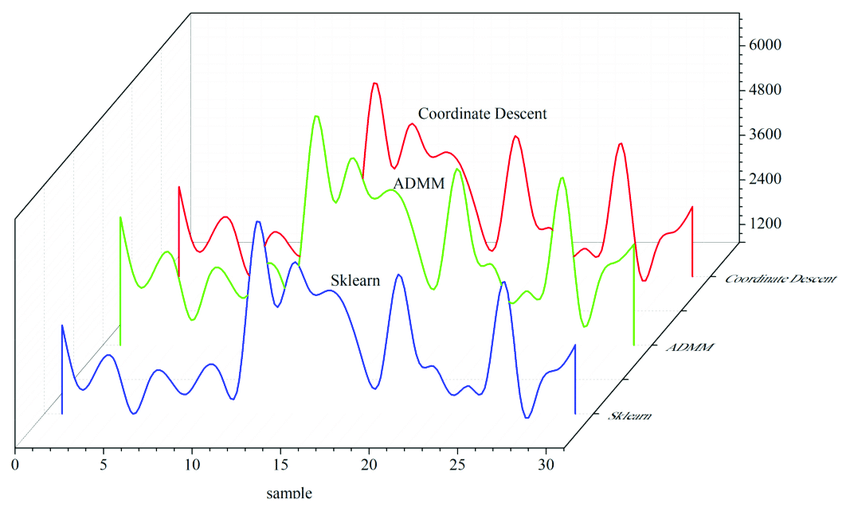

In [7]:
display(Image(filename=r'./elastic_net.PNG'))

Training Progress: 100%|███████████████████████████████████████████████████████████| 1000/1000 [00:36<00:00, 27.03it/s]


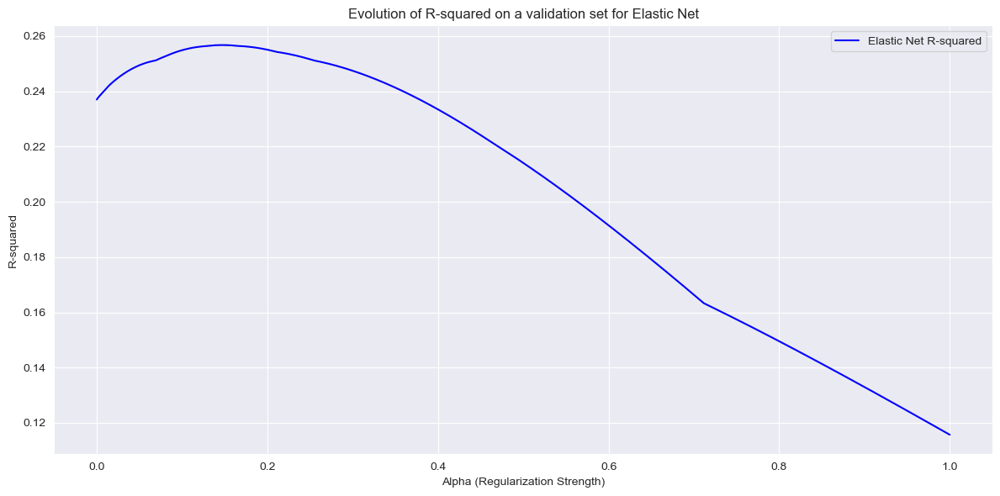

In [11]:
# Train Elastic Net
# Define the range of alpha values for Elastic Net
# Set Seaborn style to "darkgrid"
sns.set_style("darkgrid")

# Define the range of alpha values for Elastic Net
alpha_values = np.linspace(0.0001, 1.0, 1000)

# Initialize empty lists to store R-squared values for each model
elasticnet_r2_values = []

# Use tqdm to create a progress bar
for alpha in tqdm(alpha_values, desc='Training Progress'):
    # Elastic Net
    elasticnet_model = ElasticNet(alpha=alpha, l1_ratio=0.1, random_state=42)
    elasticnet_model.fit(X_train_scaled, y_train)
    y_pred_elasticnet = elasticnet_model.predict(X_validation_scaled)
    elasticnet_r2 = r2_score(y_validation, y_pred_elasticnet)
    elasticnet_r2_values.append(elasticnet_r2)

# Create a Seaborn lineplot
plt.figure(figsize=(12, 6))
sns.lineplot(x=alpha_values, y=elasticnet_r2_values, label='Elastic Net R-squared', color='b')
plt.title('Evolution of R-squared on a validation set for Elastic Net')
plt.xlabel('Alpha (Regularization Strength)')
plt.ylabel('R-squared')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Whatever the value of $\alpha$ we get a $R^2$ lower than 0.3 oon the validation set.

# A. Xgradient Boosting and Random Forest
--------------------------------------------------------------
Here max_depth is the hyperparameter to optimize because it allows easily to monitor overfitting/underfitting case through post pruning. Others hyperparameters : min_samples_leaf; learning_rate.

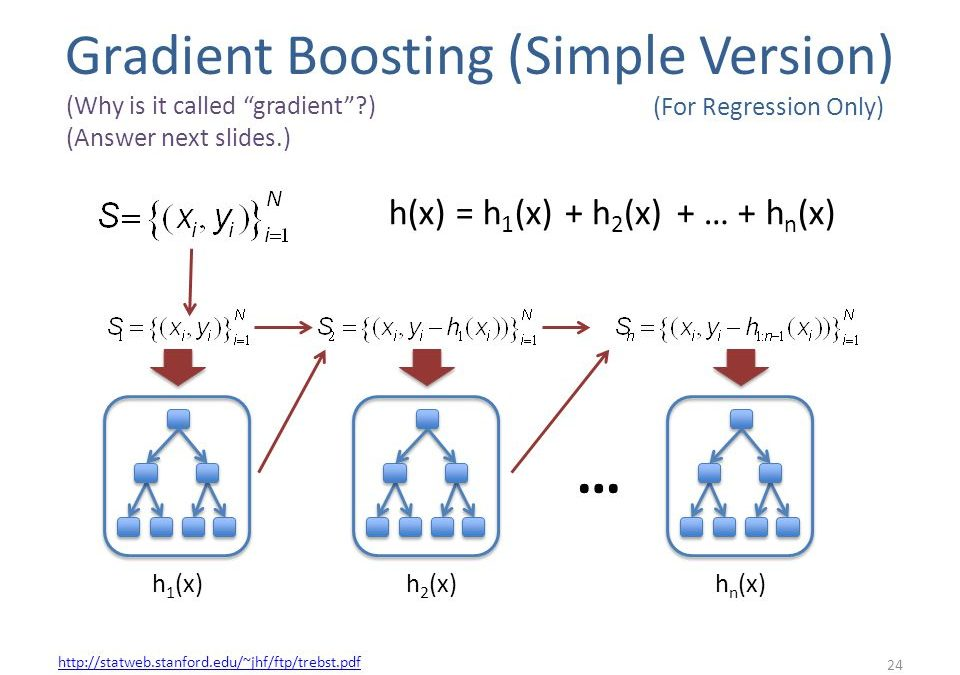

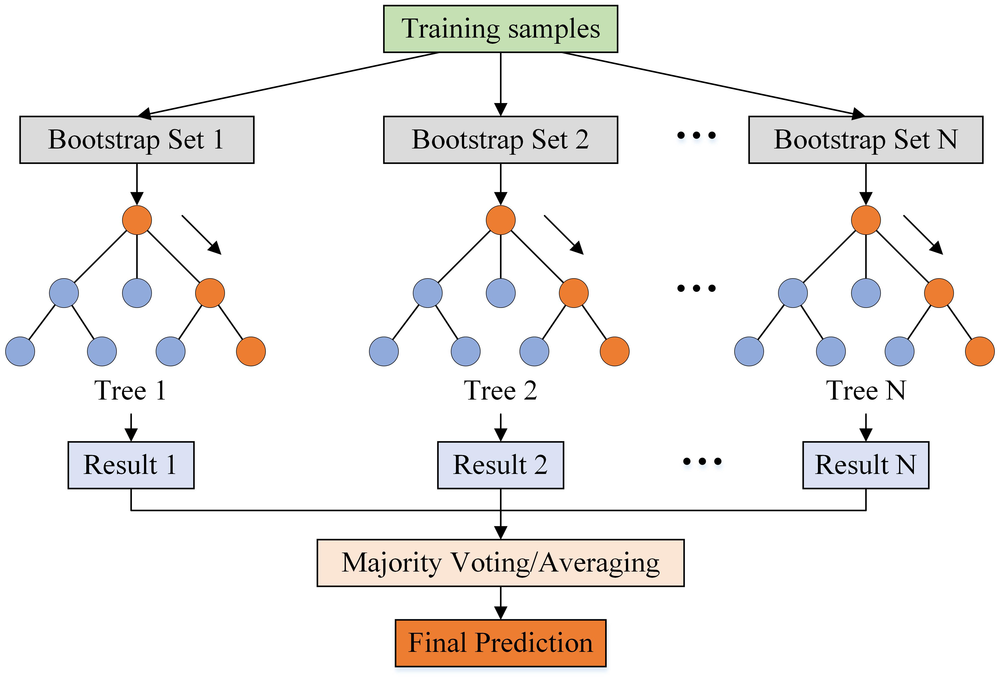

In [119]:
# Display the GradientBoosting.JPG image
display(Image(filename=r'./GradientBoosting.JPG'))
display(Image(filename=r'./RF_image.PNG'))

A. Training on the train set and evaluating on the validation set.

Training Progress: 100%|█████████████████████████████████████████████████████████████| 79/79 [2:01:24<00:00, 92.21s/it]


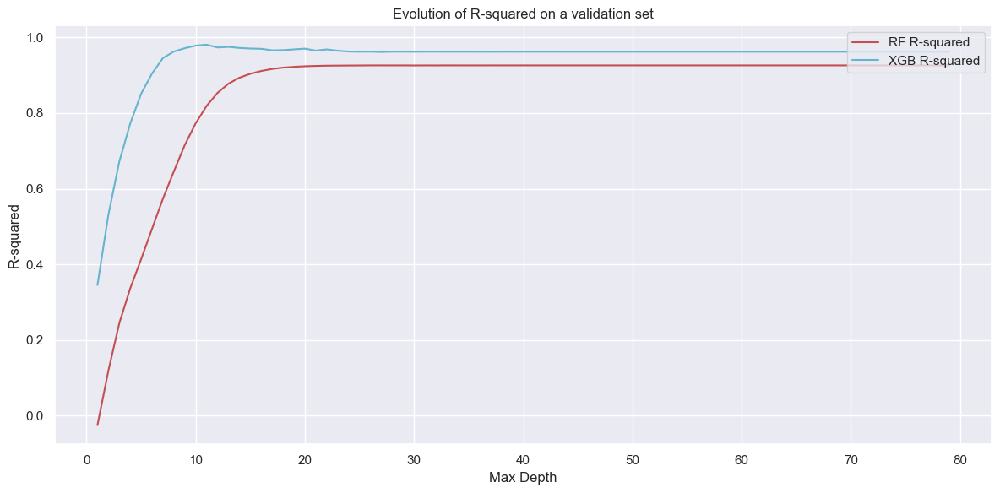

In [19]:
# Define the range of max_depth values
max_depth_values = np.arange(1, 80)

# Initialize empty lists to store R-squared values for each model
rf_r2_values = []
xgb_r2_values = []

# Use tqdm to create a progress bar
for max_depth in tqdm(max_depth_values, desc='Training Progress'):
    # Random Forest
    rf_model = RandomForestRegressor(max_depth=max_depth,min_samples_leaf =40, random_state=42)
    rf_model.fit(X_train_scaled, y_train)
    y_pred_rf = rf_model.predict(X_validation_scaled)
    rf_r2 = r2_score(y_validation, y_pred_rf)
    rf_r2_values.append(rf_r2)

    # XGBoost with default n_estimators
    xgb_model = xgb.XGBRegressor(max_depth=max_depth,learning_rate = 0.1, random_state=42)
    xgb_model.fit(X_train_scaled, y_train)
    y_pred_xgb = xgb_model.predict(X_validation_scaled)
    xgb_r2 = r2_score(y_validation, y_pred_xgb)
    xgb_r2_values.append(xgb_r2)

# Plot the evolution of R-squared for each model
plt.figure(figsize=(12, 6))
plt.plot(max_depth_values, rf_r2_values, label='RF R-squared', color='r')
plt.plot(max_depth_values, xgb_r2_values, label='XGB R-squared', color='c')
plt.title('Evolution of R-squared on a validation set')
plt.xlabel('Max Depth')
plt.ylabel('R-squared')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

B. Testing on the test set.

In [6]:
# Separate features and target
X = quant_features.drop('alpha', axis=1) 
y = quant_features['alpha']

# Determine the split indices for 60% training, 20% validation, and 20% test
train_index = int(0.6 * len(X))
validation_index = int(0.8 * len(X))

# Split the data into training, validation, and test sets based on indices
X_train = X.iloc[:train_index, :]  # Use the correct index for the training set
X_validation = X.iloc[train_index:validation_index, :]
X_test = X.iloc[validation_index:, :]  # Test set as the last part
y_train = y.iloc[:train_index]
y_validation = y.iloc[train_index:validation_index]
y_test = y.iloc[validation_index:]

# Standardize features using StandardScaler
scaler = StandardScaler()
X_train_scaled_array = scaler.fit_transform(X_train)
X_test_scaled_array = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames with column names
X_train_scaled = pd.DataFrame(X_train_scaled_array, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled_array, columns=X_test.columns)

Training Progress: 100%|█████████████████████████████████████████████████████████████| 79/79 [2:03:13<00:00, 93.59s/it]


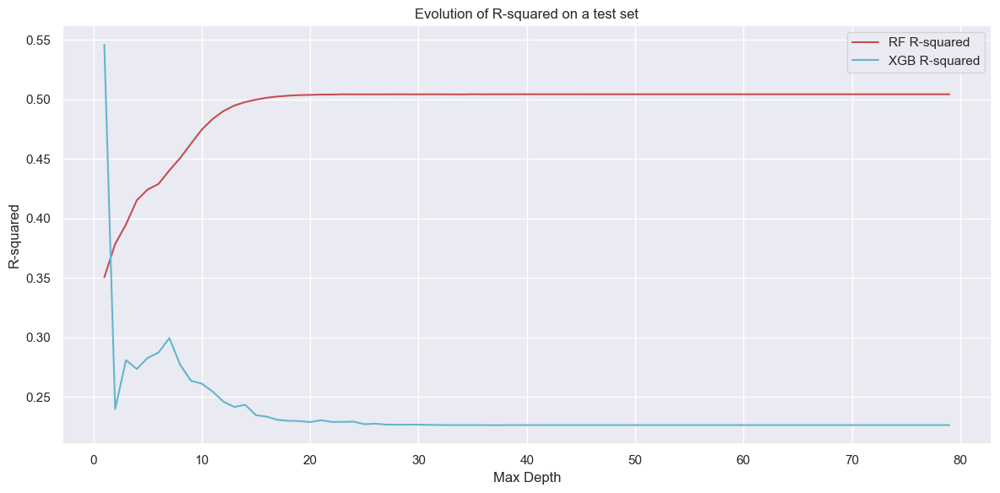

In [23]:
# Define the range of max_depth values
max_depth_values = np.arange(1, 80)

# Initialize empty lists to store R-squared values for each model
rf_r2_values = []
xgb_r2_values = []

# Use tqdm to create a progress bar
for max_depth in tqdm(max_depth_values, desc='Training Progress'):
    # Random Forest
    rf_model = RandomForestRegressor(max_depth=max_depth, min_samples_leaf=40, random_state=42)
    rf_model.fit(X_train_scaled, y_train)
    y_pred_rf = rf_model.predict(X_test_scaled)
    rf_r2 = r2_score(y_test, y_pred_rf)
    rf_r2_values.append(rf_r2)

    # XGBoost with default n_estimators
    xgb_model = xgb.XGBRegressor(max_depth=max_depth, learning_rate=0.1, random_state=42)
    xgb_model.fit(X_train_scaled, y_train)
    y_pred_xgb = xgb_model.predict(X_test_scaled)
    xgb_r2 = r2_score(y_test, y_pred_xgb)
    xgb_r2_values.append(xgb_r2)

# Set seaborn style to darkgrid
sns.set(style='darkgrid')

# Plot the evolution of R-squared for each model
plt.figure(figsize=(12, 6))
plt.plot(max_depth_values, rf_r2_values, label='RF R-squared', color='r')
plt.plot(max_depth_values, xgb_r2_values, label='XGB R-squared', color='c')
plt.title('Evolution of R-squared on a test set')
plt.xlabel('Max Depth')
plt.ylabel('R-squared')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

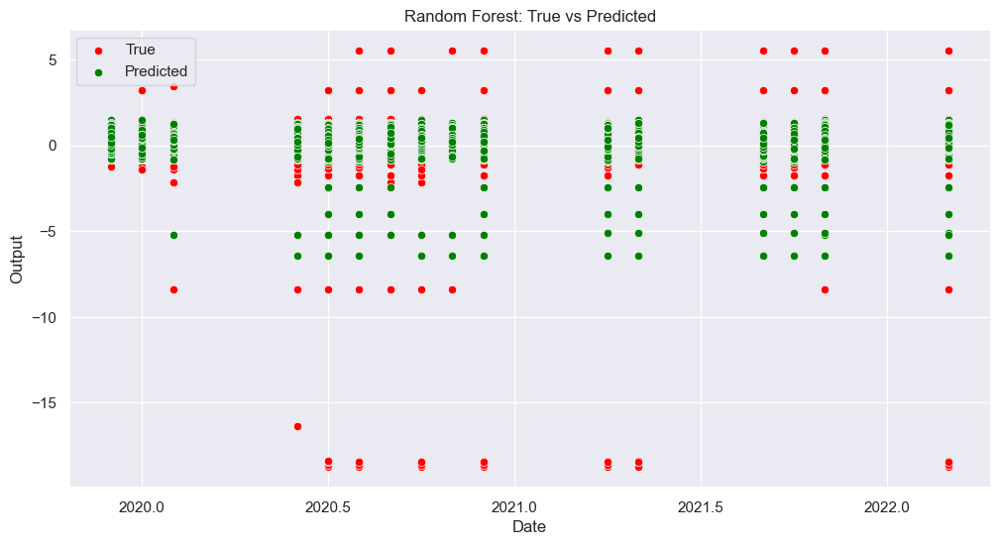

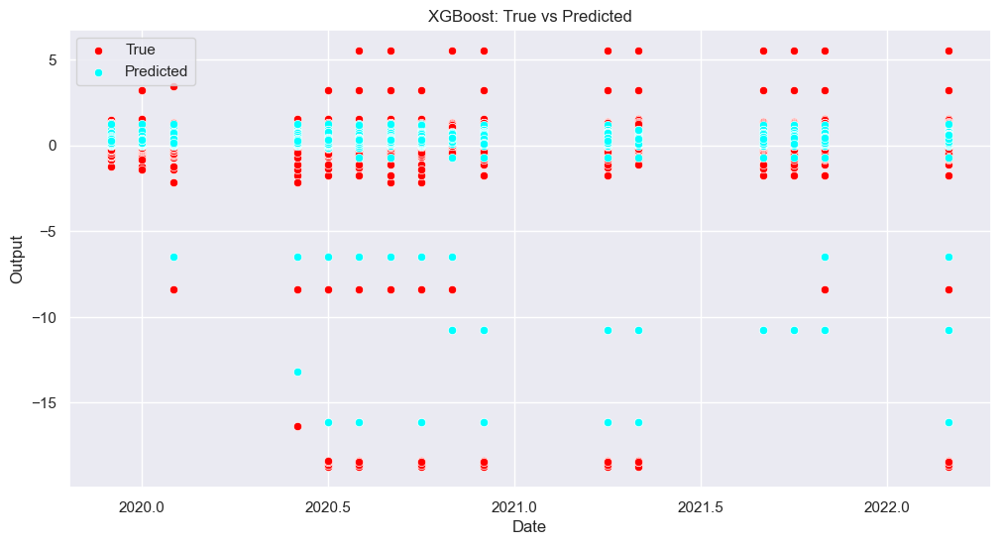

In [20]:
# Predicting with Random Forest
sns.set_style("darkgrid")
rf_model = RandomForestRegressor(max_depth=20, min_samples_leaf=40, random_state=42)
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)

# Predicting with XGradient Boosting
xgb_model = xgb.XGBRegressor(max_depth=1, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train_scaled, y_train)
y_pred_xgb = xgb_model.predict(X_test_scaled)

# Plotting true vs predicted for Random Forest
plt.figure(figsize=(12, 6))
sns.scatterplot(x=data.index[validation_index:], y=y_test, color='red', label='True')
sns.scatterplot(x=data.index[validation_index:], y=y_pred_rf, color='green', label='Predicted')
plt.title('Random Forest: True vs Predicted')
plt.xlabel('Date')
plt.ylabel('Output')
plt.legend()
plt.show()

# Plotting true vs predicted for XGBoost
plt.figure(figsize=(12, 6))
sns.scatterplot(x=data.index[validation_index:], y=y_test, color='red', label='True')
sns.scatterplot(x=data.index[validation_index:], y=y_pred_xgb, color='cyan', label='Predicted')
plt.title('XGBoost: True vs Predicted')
plt.xlabel('Date')
plt.ylabel('Output')
plt.legend()
plt.show()

Training Progress: 100%|███████████████████████████████████████████████████████████| 1000/1000 [00:35<00:00, 28.43it/s]


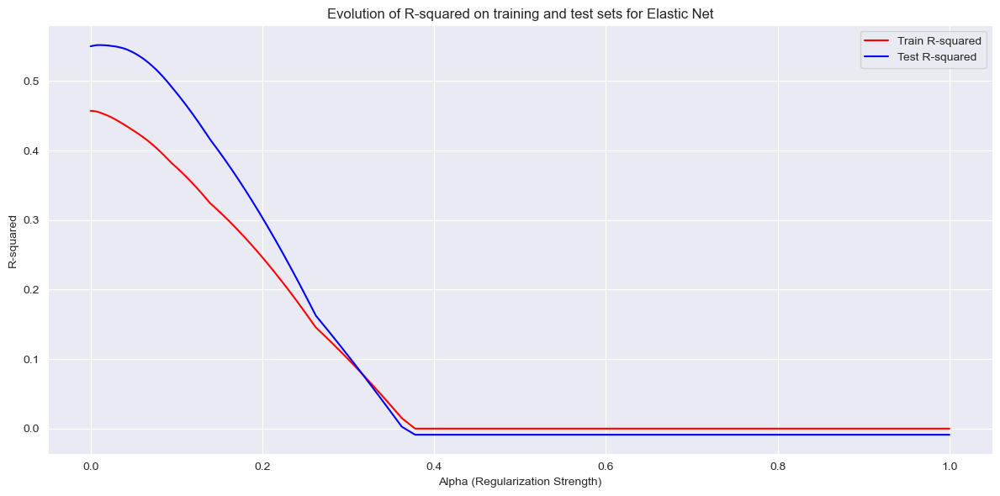

In [13]:
# Test : Elastic Net  

# Set Seaborn style to "darkgrid"
sns.set_style("darkgrid")

# Define the range of alpha values for Elastic Net
alpha_values = np.linspace(0.0001, 1.0, 1000)

# Initialize empty lists to store R-squared values for each model
elasticnet_r2_values_train = []
elasticnet_r2_values_test = []

# Use tqdm to create a progress bar
for alpha in tqdm(alpha_values, desc='Training Progress'):
    # Elastic Net
    elasticnet_model = ElasticNet(alpha=alpha, l1_ratio=0.5, random_state=42)
    elasticnet_model.fit(X_train_scaled, y_train)
    
    # Evaluate on the training set
    y_pred_train = elasticnet_model.predict(X_train_scaled)
    elasticnet_r2_train = r2_score(y_train, y_pred_train)
    elasticnet_r2_values_train.append(elasticnet_r2_train)

    # Evaluate on the test set
    y_pred_test = elasticnet_model.predict(X_test_scaled)
    elasticnet_r2_test = r2_score(y_test, y_pred_test)
    elasticnet_r2_values_test.append(elasticnet_r2_test)

# Plot the evolution of R-squared for Elastic Net using Seaborn with dark grid
plt.figure(figsize=(12, 6))
sns.lineplot(x=alpha_values, y=elasticnet_r2_values_train, label='Train R-squared', color='r')
sns.lineplot(x=alpha_values, y=elasticnet_r2_values_test, label='Test R-squared', color='b')
plt.title('Evolution of R-squared on training and test sets for Elastic Net')
plt.xlabel('Alpha (Regularization Strength)')
plt.ylabel('R-squared')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

The best $\alpha$ value is 0 meaning the corresponding a Elastic Net model behaves like Ridge Regression model.

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
Coordinate descent with no regularization may lead to unexpected results and is discouraged.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.648e+03, tolerance: 1.712e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.


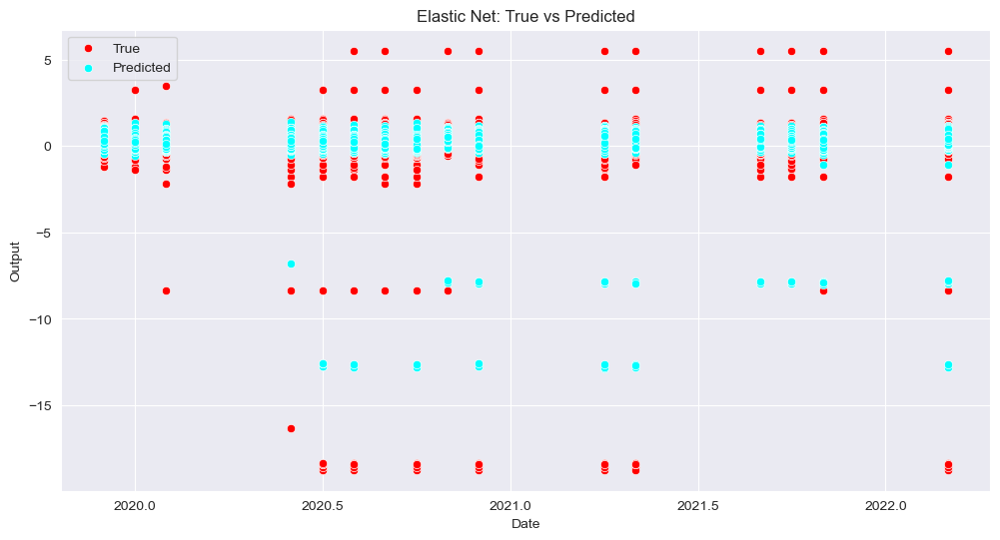

In [7]:
# Predicting with Elastic Net model 
sns.set_style("darkgrid")
elasticnet_model = ElasticNet(alpha=0, l1_ratio=0.5, random_state=42)
elasticnet_model.fit(X_train_scaled, y_train)

# Evaluate on the training set
y_pred_train = elasticnet_model.predict(X_train_scaled)

# Evaluate on the test set
y_pred_test = elasticnet_model.predict(X_test_scaled)

# Plotting true vs predicted for XGBoost
plt.figure(figsize=(12, 6))
sns.scatterplot(x=data.index[validation_index:], y=y_test, color='red', label='True')
sns.scatterplot(x=data.index[validation_index:], y=y_pred_test, color='cyan', label='Predicted')
plt.title('Elastic Net: True vs Predicted')
plt.xlabel('Date')
plt.ylabel('Output')
plt.legend()
plt.show()

Variable importance with optimized hyperparameters

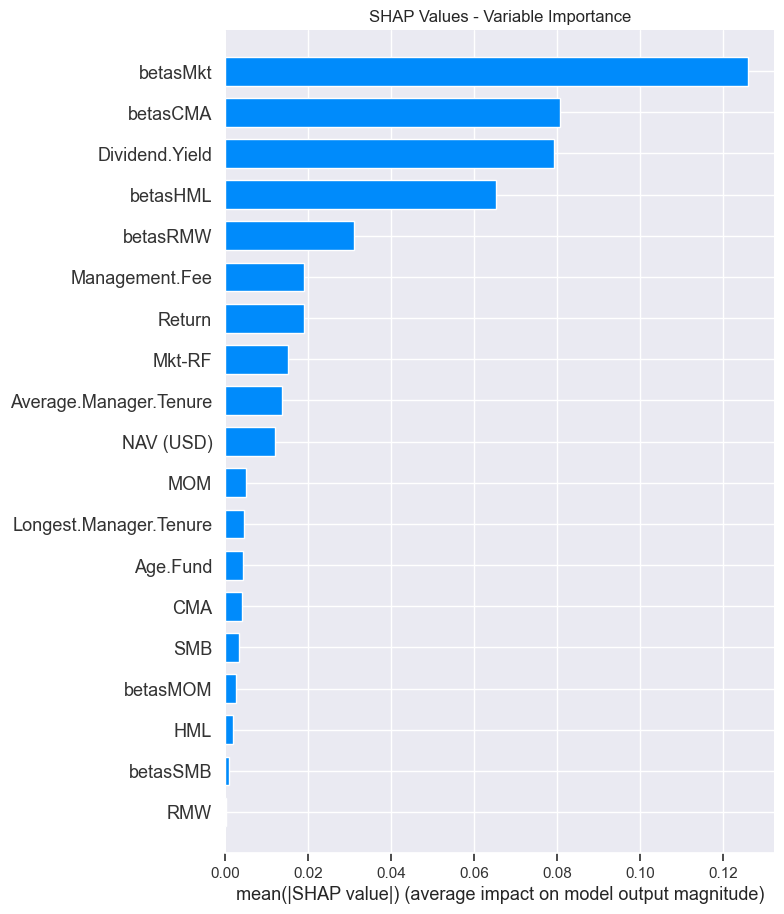

In [8]:
# Data Preparation and Scaling
X = quant_features.drop('alpha', axis=1)
y = quant_features['alpha']

# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Set Seaborn darkgrid style
sns.set(style="darkgrid")

# Linear regression
linear_reg_model = LinearRegression()
linear_reg_model.fit(X_scaled, y)

# SHAP explainer for the linear regression model
explainer = shap.LinearExplainer(linear_reg_model, X_scaled)
shap_values = explainer.shap_values(X_scaled)

# Plot summary plot
shap.summary_plot(shap_values, X_scaled, feature_names=X.columns, plot_type="bar", show=False)

# Setting plot title
plt.title('SHAP Values - Variable Importance (Linear Regression)')

# Display the plot
plt.show()

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


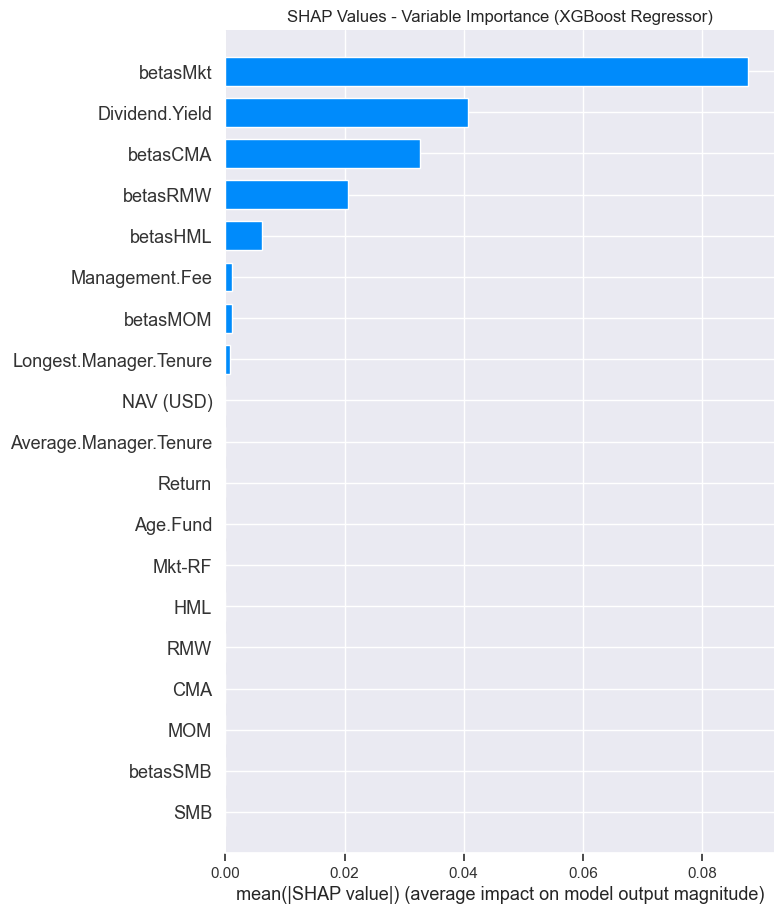

In [17]:
# Set Seaborn darkgrid style
sns.set(style="darkgrid")

# XGBoost Regressor
xgb_model = XGBRegressor(max_depth=1, learning_rate=0.1, random_state=42)
xgb_model.fit(X_scaled, y)

# SHAP explainer for the XGBoost Regressor model
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_scaled)

# Plot summary plot
shap.summary_plot(shap_values, X_scaled, feature_names=X.columns, plot_type="bar", show=False)

# Setting plot title
plt.title('SHAP Values - Variable Importance (XGBoost Regressor)')

# Display the plot
plt.show()

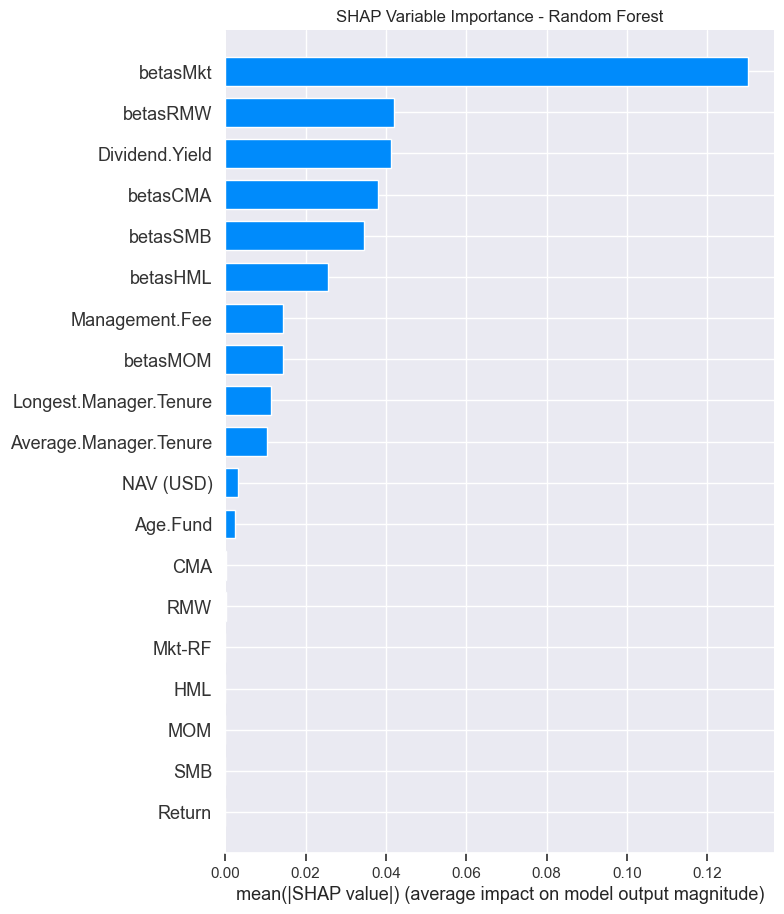

In [15]:
# Set Seaborn darkgrid style
sns.set(style="darkgrid")

# Random Forest model
rf_model = RandomForestRegressor(max_depth=20, min_samples_leaf=40, random_state=42)
rf_model.fit(X_scaled, y)

# SHAP explainer for the Random Forest model
explainer_rf = shap.TreeExplainer(rf_model)
shap_values_rf = explainer_rf.shap_values(X_scaled)

# Plot summary plot for Random Forest
shap.summary_plot(shap_values_rf, X_scaled, feature_names=X.columns, plot_type="bar", show=False)

# Setting plot title
plt.title("SHAP Variable Importance - Random Forest")

# Display the plot
plt.show()

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
Coordinate descent with no regularization may lead to unexpected results and is discouraged.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.998e+03, tolerance: 3.737e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.


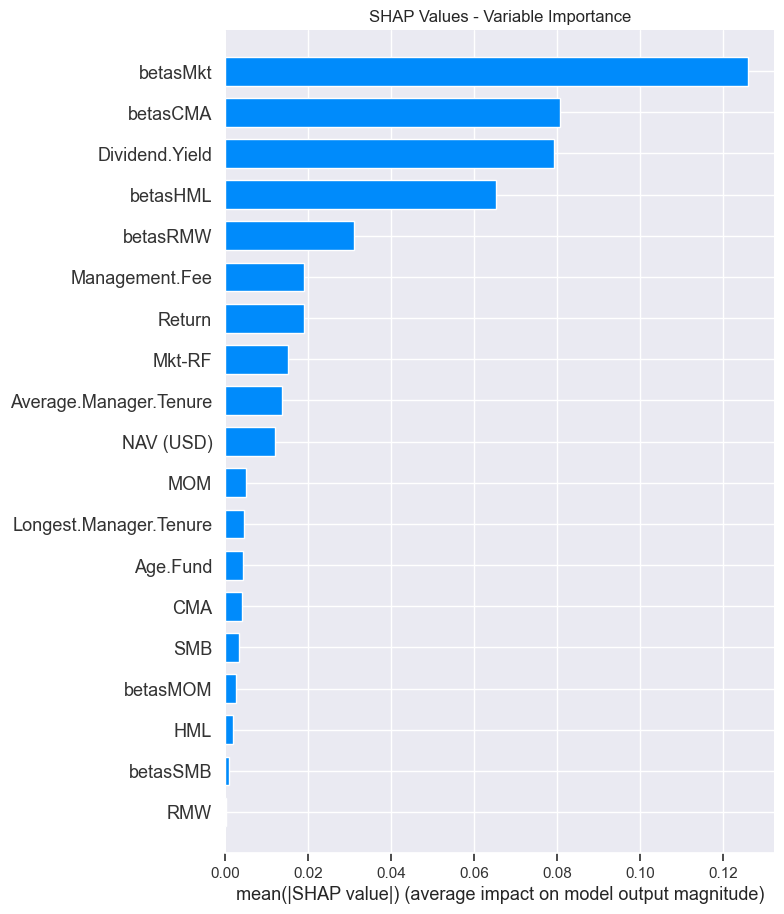

In [10]:
sns.set(style="darkgrid")
alpha = 0.0  
elasticnet_model = ElasticNet(alpha=alpha, l1_ratio=0.5, random_state=42)
elasticnet_model.fit(X_scaled, y)

# Initialize explainer with the trained model and training data
explainer = shap.Explainer(elasticnet_model, X_scaled)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_scaled)

# Plot summary plot
shap.summary_plot(shap_values, X_scaled, feature_names=X.columns, plot_type="bar", show=False)
plt.title('SHAP Values - Variable Importance (Elastic Net)')
plt.show()

Model comparison 

In [16]:
# Model Comparision
# Train Random Forest model
rf_model = RandomForestRegressor(max_depth=20, min_samples_leaf=40, random_state=42)
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)
rf_r2 = r2_score(y_test, y_pred_rf)

# Train XGBoost model
xgb_model = XGBRegressor(max_depth=1, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train_scaled, y_train)
y_pred_xgb = xgb_model.predict(X_test_scaled)
xgb_r2 = r2_score(y_test, y_pred_xgb)

# Train Elastic Net model
elasticnet_model = ElasticNet(alpha=0, l1_ratio=0.5, random_state=42)
elasticnet_model.fit(X_train_scaled, y_train)
y_pred_elasticnet = elasticnet_model.predict(X_test_scaled)
elasticnet_r2 = r2_score(y_test, y_pred_elasticnet)

# Compare R-squared values
print(f"Random Forest R-squared: {rf_r2}")
print(f"XGBoost R-squared: {xgb_r2}")
print(f"Elastic Net R-squared: {elasticnet_r2}")

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
Coordinate descent with no regularization may lead to unexpected results and is discouraged.


Random Forest R-squared: 0.5038063793544526
XGBoost R-squared: 0.5459845453509131
Elastic Net R-squared: 0.550031203573117


Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.648e+03, tolerance: 1.712e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.


# C.Training Artificial Neural Network
----------------------------------------------------------------------
There are some hyperpyrameters to choose\optimize in order to get a sophiscaticated neural network (MLP) model (we train the one with four hidden layers). Among them we point out : 
- an optimizer ; 
- the width of hidden layers;
- a learning rate; 
- the activate function.

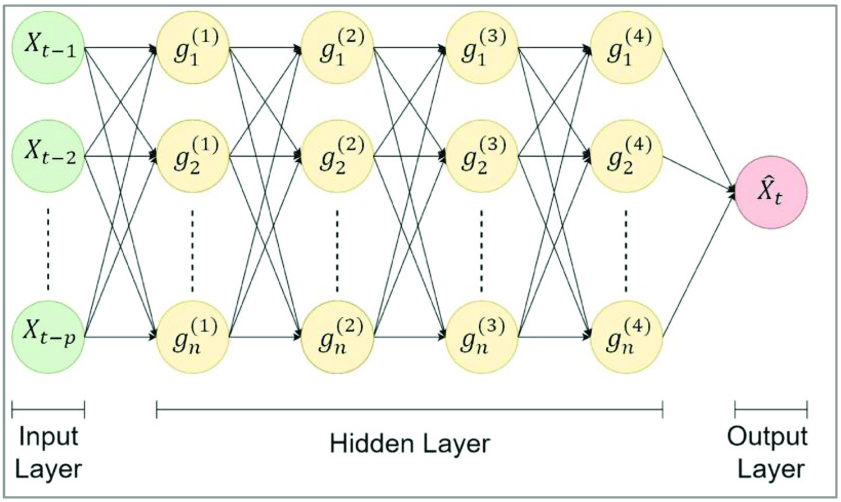

In [7]:
display(Image(filename=r'./Four_HL_MLP.png'))

In [19]:
# Define ElegantTwoLayerMLP class
class ElegantFourLayerMLP(nn.Sequential):
    def __init__(self, input_features, output_features, hidden_features):
        super().__init__(
            nn.Linear(input_features, hidden_features),
            nn.ReLU(),
            nn.Linear(hidden_features, hidden_features),
            nn.ReLU(),
            nn.Linear(hidden_features, hidden_features),
            nn.ReLU(),
            nn.Linear(hidden_features, hidden_features),
            nn.ReLU(),
            nn.Linear(hidden_features, output_features),
        )

# Function to initialize weights using Xavier initialization
def init_weights(module):
    if isinstance(module, nn.Linear):
        nn.init.xavier_uniform_(module.weight.data)
        nn.init.zeros_(module.bias.data)

In [10]:
# Data preparation
# Separate features and target
X = quant_features.drop('alpha', axis=1) 
y = quant_features['alpha']

# Determine the split indices for 60% training, 20% validation, and 20% test
train_index = int(0.6 * len(X))
validation_index = int(0.8 * len(X))

# Split the data into training, validation, and test sets based on indices
X_train = X.iloc[:train_index, :]
X_val = X.iloc[train_index:validation_index, :]
X_test = X.iloc[validation_index:, :]
y_train = y.iloc[:train_index]
y_val = y.iloc[train_index:validation_index]
y_test = y.iloc[validation_index:]

# Standardize features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)  
X_val_tensor = torch.tensor(X_val_scaled, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val.values, dtype=torch.float32).view(-1, 1)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

Training lr=0.001: 100%|███████████████████████████████████████████████████████████| 1000/1000 [20:00<00:00,  1.20s/it]


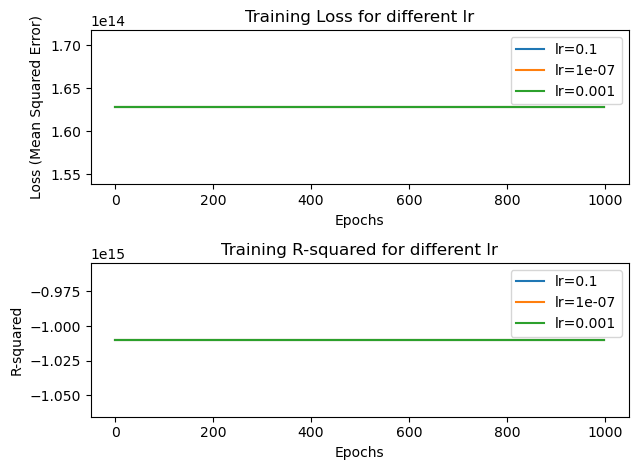

In [16]:
# A.1 Learning rate selection (Adam as optimizer)
# Number of iterations for training

iters = 1000

# Learning rates to test
lr_values = [1e-1, 1e-7, 1e-3]

# Lists to store training loss and R-squared for each learning rate
train_losses = []
train_r2_scores = []

# Reset the neural network
network = ElegantFourLayerMLP(input_features=X.shape[1], output_features=1, hidden_features= 500)
network.apply(init_weights)

# Define the Mean Squared Error (MSE) loss as criterion
criterion = nn.MSELoss()

# Lists to store training loss and R-squared for each learning rate
all_train_losses_lr = []
all_train_r2_scores_lr = []

# Loop over each learning rate
for lr in lr_values:
    # Create an instance of the Adam optimizer with the current learning rate
    optimizer = optim.Adam(params=network.parameters(), lr=lr)

    # Lists to store training loss and R-squared for the current learning rate
    train_losses_lr = []
    train_r2_scores_lr = []

    # Use tqdm for the progress bar
    for i in tqdm(range(iters), desc=f'Training lr={lr}'):
        # Forward pass
        y_pred_train = network(X_train_tensor)

        # Compute the MSE loss
        train_loss = criterion(y_pred_train, y_train_tensor)

        # Check for NaN values in y_pred_train
        nan_check_y_pred = torch.isnan(y_pred_train).sum().item()

        if nan_check_y_pred > 0:
            # Handle NaN values (replace NaN with a suitable value or drop NaN-containing rows)
            indices_with_nans = torch.isnan(y_pred_train)
            X_train_tensor = X_train_tensor[~indices_with_nans]
            y_train_tensor = y_train_tensor[~indices_with_nans]

            # Continue with any other handling you may need

            # Skip R-squared calculation if NaN values are detected
            continue

        # Calculate R-squared only if there are no NaN values
        train_r2 = r2_score(y_train_tensor, y_pred_train.detach().numpy())
        train_losses_lr.append(train_loss.item())
        train_r2_scores_lr.append(train_r2)

    # Store the training loss and R-squared values for the current learning rate
    all_train_losses_lr.append(train_losses_lr)
    all_train_r2_scores_lr.append(train_r2_scores_lr)

# Plot the training loss and R-squared curves for each learning rate
fig, axs = plt.subplots(2, 1)

for i, lr in enumerate(lr_values):
    axs[0].plot(all_train_losses_lr[i], label=f'lr={lr}')

axs[0].set_title('Training Loss for different lr')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

for i, lr in enumerate(lr_values):
    axs[1].plot(all_train_r2_scores_lr[i], label=f'lr={lr}')

axs[1].set_title('Training R-squared for different lr')
axs[1].legend(loc='upper right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

Bad results obtained. The Loss curve does not converge towards zero and the R-squared curve only has  negative values.

Training lr=0.001: 100%|███████████████████████████████████████████████████████████| 1000/1000 [18:47<00:00,  1.13s/it]


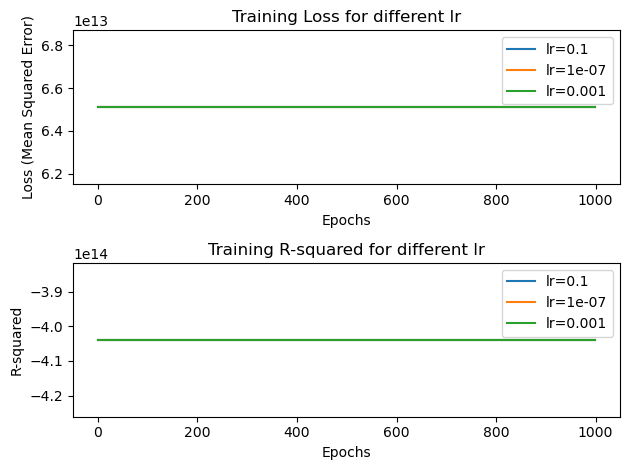

In [18]:
# A.2 Learning rate selection (SGD as optimizer)
# Number of iterations for training

iters = 1000

# Learning rates to test
lr_values = [1e-1, 1e-7, 1e-3]

# Lists to store training loss and R-squared for each learning rate
train_losses = []
train_r2_scores = []

# Reset the neural network
network = ElegantFourLayerMLP(input_features=X.shape[1], output_features=1, hidden_features= 500)
network.apply(init_weights)

# Define the Mean Squared Error (MSE) loss as criterion
criterion = nn.MSELoss()

# Lists to store training loss and R-squared for each learning rate
all_train_losses_lr = []
all_train_r2_scores_lr = []

# Loop over each learning rate
for lr in lr_values:
    # Create an instance of the Adam optimizer with the current learning rate
    optimizer = optim.SGD(params=network.parameters(), lr=lr)

    # Lists to store training loss and R-squared for the current learning rate
    train_losses_lr = []
    train_r2_scores_lr = []

    # Use tqdm for the progress bar
    for i in tqdm(range(iters), desc=f'Training lr={lr}'):
        # Forward pass
        y_pred_train = network(X_train_tensor)

        # Compute the MSE loss
        train_loss = criterion(y_pred_train, y_train_tensor)

        # Check for NaN values in y_pred_train
        nan_check_y_pred = torch.isnan(y_pred_train).sum().item()

        if nan_check_y_pred > 0:
            # Handle NaN values (replace NaN with a suitable value or drop NaN-containing rows)
            indices_with_nans = torch.isnan(y_pred_train)
            X_train_tensor = X_train_tensor[~indices_with_nans]
            y_train_tensor = y_train_tensor[~indices_with_nans]

            # Continue with any other handling you may need

            # Skip R-squared calculation if NaN values are detected
            continue

        # Calculate R-squared only if there are no NaN values
        train_r2 = r2_score(y_train_tensor, y_pred_train.detach().numpy())
        train_losses_lr.append(train_loss.item())
        train_r2_scores_lr.append(train_r2)

    # Store the training loss and R-squared values for the current learning rate
    all_train_losses_lr.append(train_losses_lr)
    all_train_r2_scores_lr.append(train_r2_scores_lr)

# Plot the training loss and R-squared curves for each learning rate
fig, axs = plt.subplots(2, 1)

for i, lr in enumerate(lr_values):
    axs[0].plot(all_train_losses_lr[i], label=f'lr={lr}')

axs[0].set_title('Training Loss for different lr')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

for i, lr in enumerate(lr_values):
    axs[1].plot(all_train_r2_scores_lr[i], label=f'lr={lr}')

axs[1].set_title('Training R-squared for different lr')
axs[1].legend(loc='upper right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

Constant curves gotten.

The loss curve converges towards zero while the loss $R^2$ tends towards zero.

Training with ReLU, Adam and hidden width=1000: 100%|████████████████████████████| 1000/1000 [3:34:39<00:00, 12.88s/it]


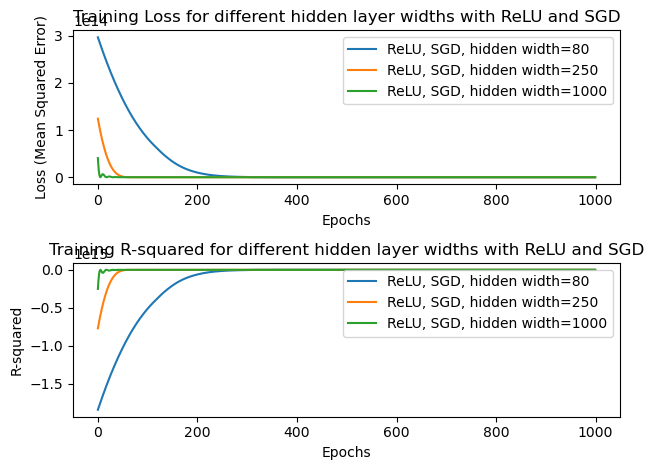

In [12]:
# C.2 Hidden layer widths selection
# Hidden layer widths
iters = 1000
hidden_layer_widths = [80, 250, 1000]

criterion = nn.MSELoss()
# Lists to store training loss and R-squared for each hidden layer width
all_train_losses_hw = []
all_train_r2_scores_hw = []

# ReLU activation function
activation_function = nn.ReLU()

# Loop over each hidden layer width
for hidden_width in hidden_layer_widths:
    # Lists to store training loss and R-squared for the current hidden layer width
    train_losses_hw = []
    train_r2_scores_hw = []

    # Reset the neural network with ReLU activation and the current hidden layer width
    network = ElegantFourLayerMLP(
        input_features=X.shape[1],
        output_features=1,
        hidden_features=hidden_width
    )
    network.apply(init_weights)
    # Set ReLU activation for all hidden layers
    network[1] = activation_function
    network[3] = activation_function
    network[5] = activation_function
    network[7] = activation_function

    # Create an instance of the SGD optimizer with a chosen learning rate
    optimizer = optim.Adam(params=network.parameters(), lr=1e-5)

    # Convert your pandas DataFrames to PyTorch tensors
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)

    # Loop over the specified number of iterations
    for i in tqdm(range(iters), desc=f'Training with ReLU, Adam and hidden width={hidden_width}'):
        # Forward pass
        y_pred_train = network(X_train_tensor)

        # Compute the Mean Squared Error (MSE) loss
        train_loss = criterion(y_pred_train, y_train_tensor)

        # Check for NaN values in y_pred_train
        nan_check_y_pred = torch.isnan(y_pred_train).sum().item()

        if nan_check_y_pred > 0:
            # Handle NaN values (replace NaN with a suitable value or drop NaN-containing rows)
            indices_with_nans = torch.isnan(y_pred_train)
            X_train_tensor = X_train_tensor[~indices_with_nans]
            y_train_tensor = y_train_tensor[~indices_with_nans]

            # Skip R-squared calculation if NaN values are detected
            continue

        # Calculate R-squared only if there are no NaN values
        train_r2 = r2_score(y_train_tensor, y_pred_train.detach().numpy())
        train_losses_hw.append(train_loss.item())
        train_r2_scores_hw.append(train_r2)

        # Perform backward pass and optimization step
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

    # Store the training loss and R-squared values for the current hidden layer width
    all_train_losses_hw.append(train_losses_hw)
    all_train_r2_scores_hw.append(train_r2_scores_hw)

# Plot the training loss and R-squared curves for each hidden layer width
fig, axs = plt.subplots(2, 1)

for i, hidden_width in enumerate(hidden_layer_widths):
    axs[0].plot(all_train_losses_hw[i], label=f'ReLU, SGD, hidden width={hidden_width}')

axs[0].set_title('Training Loss for different hidden layer widths with ReLU and SGD')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

for i, hidden_width in enumerate(hidden_layer_widths):
    axs[1].plot(all_train_r2_scores_hw[i], label=f'ReLU, SGD, hidden width={hidden_width}')

axs[1].set_title('Training R-squared for different hidden layer widths with ReLU and SGD')
axs[1].legend(loc='upper right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

After some workout trails, we set the hyperparameters as follows:
Width of hidden layers : 3000, lr= 1e-5; optimizer : Adam ; activate function :ReLU.

Training with ReLU, Adam, and hidden width=3000: 100%|██████████████████████████████| 25/25 [1:55:12<00:00, 276.49s/it]


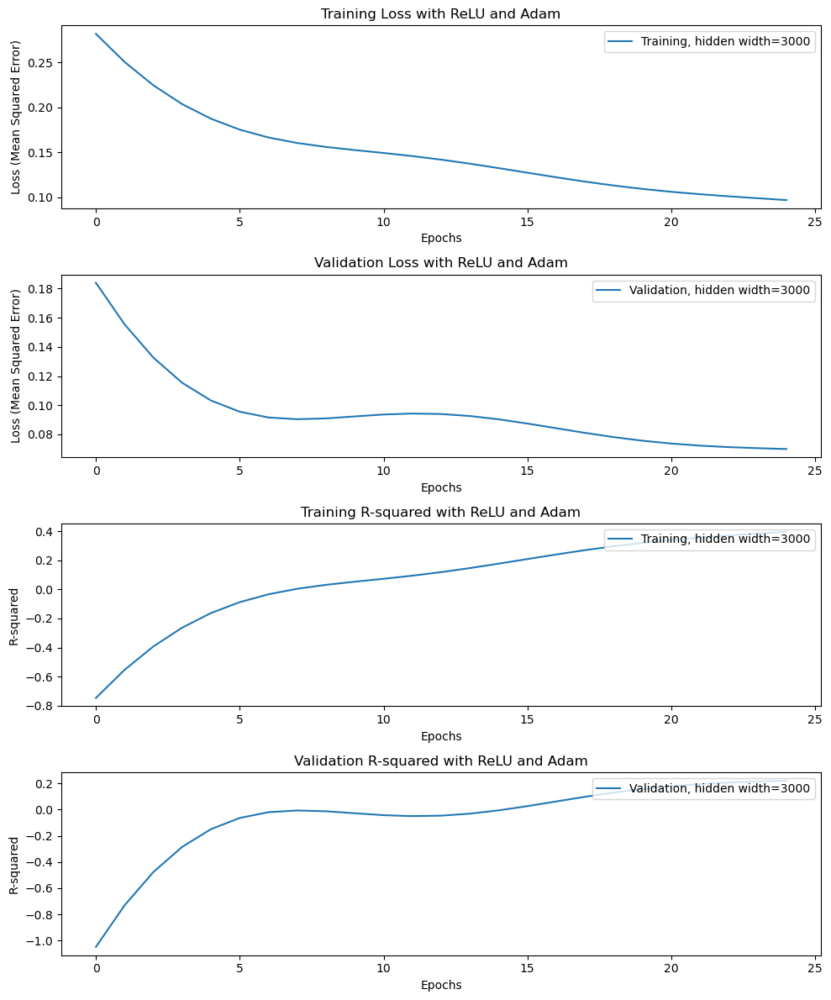

In [11]:
# Hyperparameters
iters = 25
hidden_layer_widths = [3000]
learning_rate = 1e-5

criterion = nn.MSELoss()

# Lists to store training and validation loss and R-squared for each hidden layer width
all_train_losses_hw = []
all_train_r2_scores_hw = []
all_val_losses_hw = []
all_val_r2_scores_hw = []

# Loop over each hidden layer width
for hidden_width in hidden_layer_widths:
    # Lists to store training and validation loss and R-squared for the current hidden layer width
    train_losses_hw = []
    train_r2_scores_hw = []
    val_losses_hw = []
    val_r2_scores_hw = []

    # Reset the neural network with ReLU activation and the current hidden layer width
    network = ElegantFourLayerMLP(
        input_features=X.shape[1],
        output_features=1,
        hidden_features=hidden_width
    )
    network.apply(init_weights)

    # Create an instance of the Adam optimizer with the chosen learning rate
    optimizer = optim.Adam(params=network.parameters(), lr=learning_rate)

    # Loop over the specified number of iterations
    for i in tqdm(range(iters), desc=f'Training with ReLU, Adam, and hidden width={hidden_width}'):
        # Forward pass for training data
        y_pred_train = network(X_train_tensor)
        train_loss = criterion(y_pred_train, y_train_tensor)
        nan_check_y_pred_train = torch.isnan(y_pred_train).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_train > 0:
            continue

        train_r2 = r2_score(y_train_tensor.numpy(), y_pred_train.detach().numpy())
        train_losses_hw.append(train_loss.item())
        train_r2_scores_hw.append(train_r2)

        # Forward pass for validation data
        y_pred_val = network(X_val_tensor)
        val_loss = criterion(y_pred_val, y_val_tensor)
        nan_check_y_pred_val = torch.isnan(y_pred_val).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_val > 0:
            continue

        val_r2 = r2_score(y_val_tensor.numpy(), y_pred_val.detach().numpy())
        val_losses_hw.append(val_loss.item())
        val_r2_scores_hw.append(val_r2)

        # Perform backward pass and optimization step for training data
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

    # Store the training and validation loss and R-squared values for the current hidden layer width
    all_train_losses_hw.append(train_losses_hw)
    all_train_r2_scores_hw.append(train_r2_scores_hw)
    all_val_losses_hw.append(val_losses_hw)
    all_val_r2_scores_hw.append(val_r2_scores_hw)

# Plot the training and validation loss and R-squared curves for each hidden layer width
fig, axs = plt.subplots(4, 1, figsize=(10, 12))

for i, hidden_width in enumerate(hidden_layer_widths):
    axs[0].plot(all_train_losses_hw[i], label=f'Training, hidden width={hidden_width}')
    axs[1].plot(all_val_losses_hw[i], label=f'Validation, hidden width={hidden_width}')

axs[0].set_title('Training Loss with ReLU and Adam')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

axs[1].set_title('Validation Loss with ReLU and Adam')
axs[1].legend(loc='upper right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss (Mean Squared Error)')

for i, hidden_width in enumerate(hidden_layer_widths):
    axs[2].plot(all_train_r2_scores_hw[i], label=f'Training, hidden width={hidden_width}')
    axs[3].plot(all_val_r2_scores_hw[i], label=f'Validation, hidden width={hidden_width}')

axs[2].set_title('Training R-squared with ReLU and Adam')
axs[2].legend(loc='upper right')
axs[2].set_xlabel('Epochs')
axs[2].set_ylabel('R-squared')

axs[3].set_title('Validation R-squared with ReLU and Adam')
axs[3].legend(loc='upper right')
axs[3].set_xlabel('Epochs')
axs[3].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

Architecture adopted. We wil increase therefore the number of epochs in order to decrease more the loss while increasing the $R^2$.

Training with ReLU, Adam, and hidden width=3000: 100%|██████████████████████████████| 80/80 [6:26:18<00:00, 289.73s/it]


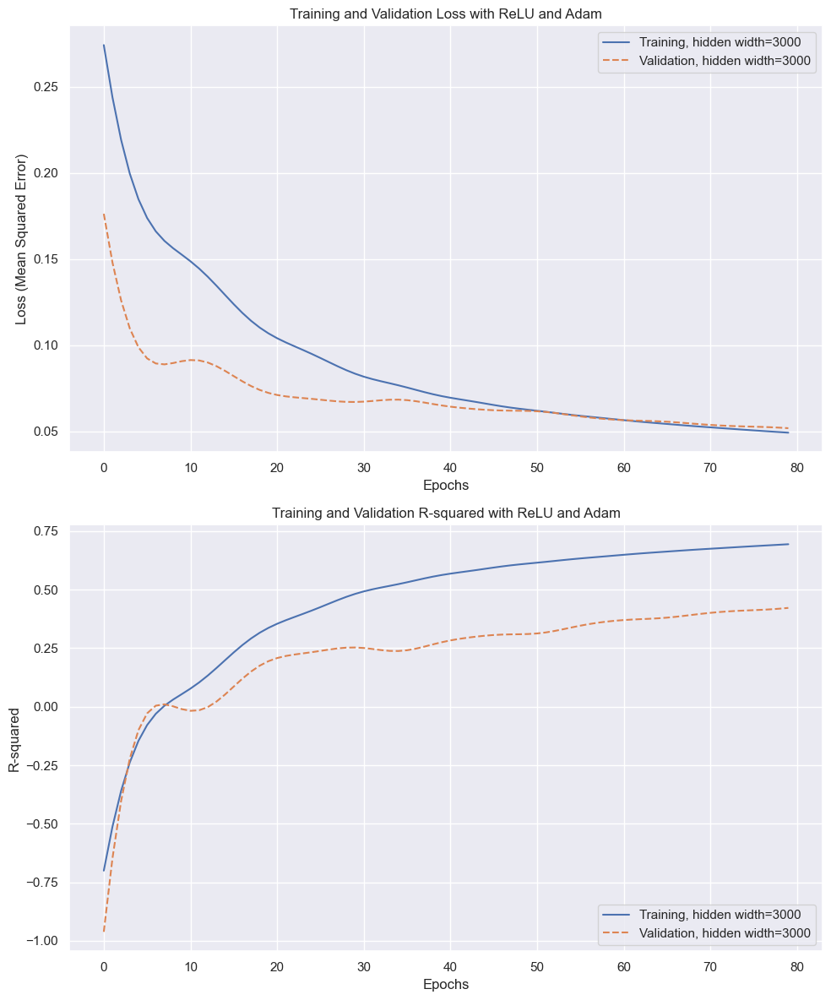

In [12]:
sns.set(style='darkgrid')

# Hyperparameters
iters = 80
hidden_layer_widths = [3000]
learning_rate = 1e-5

criterion = nn.MSELoss()

# Lists to store training and validation loss and R-squared for each hidden layer width
all_train_losses_hw = []
all_train_r2_scores_hw = []
all_val_losses_hw = []
all_val_r2_scores_hw = []

# Loop over each hidden layer width
for hidden_width in hidden_layer_widths:
    # Lists to store training and validation loss and R-squared for the current hidden layer width
    train_losses_hw = []
    train_r2_scores_hw = []
    val_losses_hw = []
    val_r2_scores_hw = []

    # Reset the neural network with ReLU activation and the current hidden layer width
    network = ElegantFourLayerMLP(
        input_features=X.shape[1],
        output_features=1,
        hidden_features=hidden_width
    )
    network.apply(init_weights)

    # Create an instance of the Adam optimizer with the chosen learning rate
    optimizer = optim.Adam(params=network.parameters(), lr=learning_rate)

    # Loop over the specified number of iterations
    for i in tqdm(range(iters), desc=f'Training with ReLU, Adam, and hidden width={hidden_width}'):
        # Forward pass for training data
        y_pred_train = network(X_train_tensor)
        train_loss = criterion(y_pred_train, y_train_tensor)
        nan_check_y_pred_train = torch.isnan(y_pred_train).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_train > 0:
            continue

        train_r2 = r2_score(y_train_tensor.numpy(), y_pred_train.detach().numpy())
        train_losses_hw.append(train_loss.item())
        train_r2_scores_hw.append(train_r2)

        # Forward pass for validation data
        y_pred_val = network(X_val_tensor)
        val_loss = criterion(y_pred_val, y_val_tensor)
        nan_check_y_pred_val = torch.isnan(y_pred_val).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_val > 0:
            continue

        val_r2 = r2_score(y_val_tensor.numpy(), y_pred_val.detach().numpy())
        val_losses_hw.append(val_loss.item())
        val_r2_scores_hw.append(val_r2)

        # Perform backward pass and optimization step for training data
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

    # Store the training and validation loss and R-squared values for the current hidden layer width
    all_train_losses_hw.append(train_losses_hw)
    all_train_r2_scores_hw.append(train_r2_scores_hw)
    all_val_losses_hw.append(val_losses_hw)
    all_val_r2_scores_hw.append(val_r2_scores_hw)

# Plot the training and validation loss curves for each hidden layer width
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

for i, hidden_width in enumerate(hidden_layer_widths):
    sns.lineplot(ax=axs[0], x=range(iters), y=all_train_losses_hw[i], label=f'Training, hidden width={hidden_width}')
    sns.lineplot(ax=axs[0], x=range(iters), y=all_val_losses_hw[i], label=f'Validation, hidden width={hidden_width}', linestyle='dashed')

axs[0].set_title('Training and Validation Loss with ReLU and Adam')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

# Plot the training and validation R-squared curves for each hidden layer width
for i, hidden_width in enumerate(hidden_layer_widths):
    sns.lineplot(ax=axs[1], x=range(iters), y=all_train_r2_scores_hw[i], label=f'Training, hidden width={hidden_width}')
    sns.lineplot(ax=axs[1], x=range(iters), y=all_val_r2_scores_hw[i], label=f'Validation, hidden width={hidden_width}', linestyle='dashed')

axs[1].set_title('Training and Validation R-squared with ReLU and Adam')
axs[1].legend(loc='lower right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

In [38]:
# Data preparation for thet test (merging the training test and the validation to form a new training 
# set)

# Separate features and target
X = quant_features.drop('alpha', axis=1) 
y = quant_features['alpha']

# Determine the split indices for 80% training and 20% test
train_index = int(0.8 * len(X))

# Split the data into training and test sets based on indices
X_train = X.iloc[:train_index, :]
X_test = X.iloc[train_index:, :]
y_train = y.iloc[:train_index]
y_test = y.iloc[train_index:]

# Standardize features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

Training with ReLU, Adam, and hidden width=3000: 100%|█████████████████████████████| 80/80 [15:13:59<00:00, 685.50s/it]


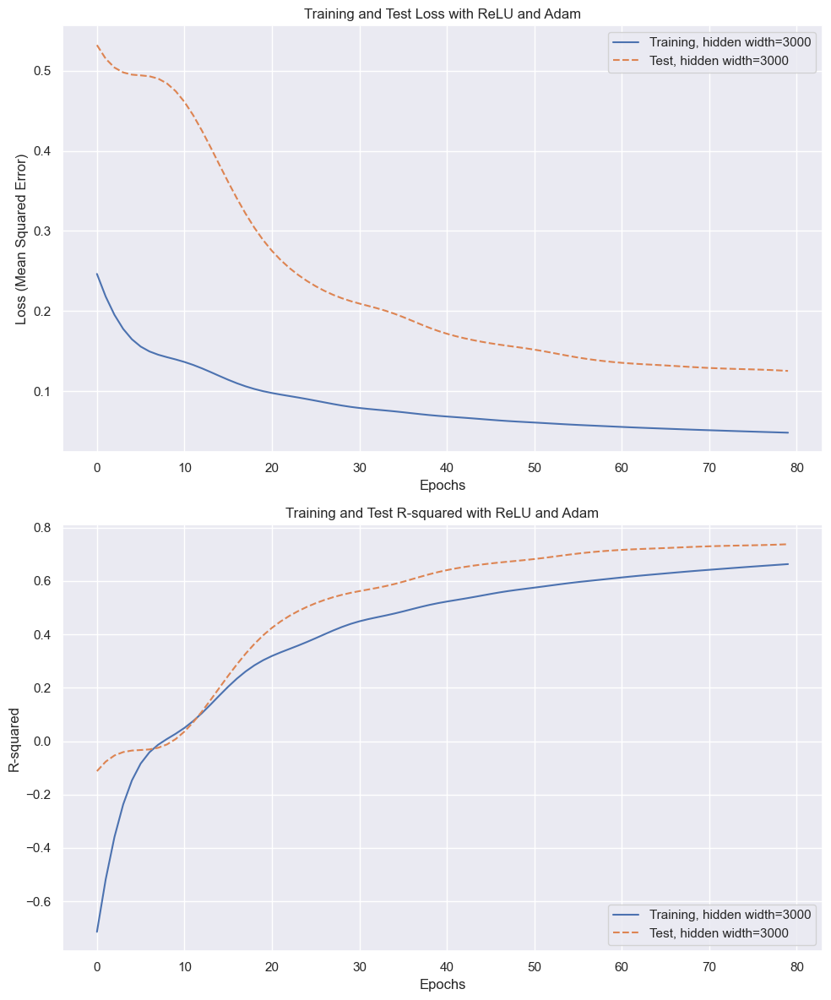

In [39]:
# Testing
# Set the Seaborn style
sns.set(style='darkgrid')

# Hyperparameters
iters = 80
hidden_layer_widths = [3000]
learning_rate = 1e-5

criterion = nn.MSELoss()

# Lists to store training and test loss and R-squared for each hidden layer width
all_train_losses_hw = []
all_train_r2_scores_hw = []
all_test_losses_hw = []
all_test_r2_scores_hw = []

# Loop over each hidden layer width
for hidden_width in hidden_layer_widths:
    # Lists to store training and test loss and R-squared for the current hidden layer width
    train_losses_hw = []
    train_r2_scores_hw = []
    test_losses_hw = []
    test_r2_scores_hw = []

    # Reset the neural network with ReLU activation and the current hidden layer width
    network = ElegantFourLayerMLP(
        input_features=X_train_tensor.shape[1],
        output_features=1,
        hidden_features=hidden_width
    )
    network.apply(init_weights)

    # Create an instance of the Adam optimizer with the chosen learning rate
    optimizer = optim.Adam(params=network.parameters(), lr=learning_rate)

    # Loop over the specified number of iterations
    for i in tqdm(range(iters), desc=f'Training with ReLU, Adam, and hidden width={hidden_width}'):
        # Forward pass for training data
        y_pred_train = network(X_train_tensor)
        train_loss = criterion(y_pred_train, y_train_tensor)
        nan_check_y_pred_train = torch.isnan(y_pred_train).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_train > 0:
            continue

        train_r2 = r2_score(y_train_tensor.numpy(), y_pred_train.detach().numpy())
        train_losses_hw.append(train_loss.item())
        train_r2_scores_hw.append(train_r2)

        # Forward pass for test data
        y_pred_test = network(X_test_tensor)
        test_loss = criterion(y_pred_test, y_test_tensor)
        nan_check_y_pred_test = torch.isnan(y_pred_test).sum().item()

        # Skip iteration if NaN values are detected
        if nan_check_y_pred_test > 0:
            continue

        test_r2 = r2_score(y_test_tensor.numpy(), y_pred_test.detach().numpy())
        test_losses_hw.append(test_loss.item())
        test_r2_scores_hw.append(test_r2)

        # Perform backward pass and optimization step for training data
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

    # Store the training and test loss and R-squared values for the current hidden layer width
    all_train_losses_hw.append(train_losses_hw)
    all_train_r2_scores_hw.append(train_r2_scores_hw)
    all_test_losses_hw.append(test_losses_hw)
    all_test_r2_scores_hw.append(test_r2_scores_hw)

# Plot the training and test loss curves for each hidden layer width
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

for i, hidden_width in enumerate(hidden_layer_widths):
    sns.lineplot(ax=axs[0], x=range(iters), y=all_train_losses_hw[i], label=f'Training, hidden width={hidden_width}')
    sns.lineplot(ax=axs[0], x=range(iters), y=all_test_losses_hw[i], label=f'Test, hidden width={hidden_width}', linestyle='dashed')

axs[0].set_title('Training and Test Loss with ReLU and Adam')
axs[0].legend(loc='upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss (Mean Squared Error)')

# Plot the training and test R-squared curves for each hidden layer width
for i, hidden_width in enumerate(hidden_layer_widths):
    sns.lineplot(ax=axs[1], x=range(iters), y=all_train_r2_scores_hw[i], label=f'Training, hidden width={hidden_width}')
    sns.lineplot(ax=axs[1], x=range(iters), y=all_test_r2_scores_hw[i], label=f'Test, hidden width={hidden_width}', linestyle='dashed')

axs[1].set_title('Training and Test R-squared with ReLU and Adam')
axs[1].legend(loc='lower right')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('R-squared')

plt.tight_layout()
plt.show()

# Conclusion
------------------------------------------------

Obviously the neural network model obtained is the best among all the models trained on this project. However, I we see it, forming a neural network model requires a lot of time. Thereby, the out-sample prediction exercise with xgradient boosting model since it is the second best model that we obtained.

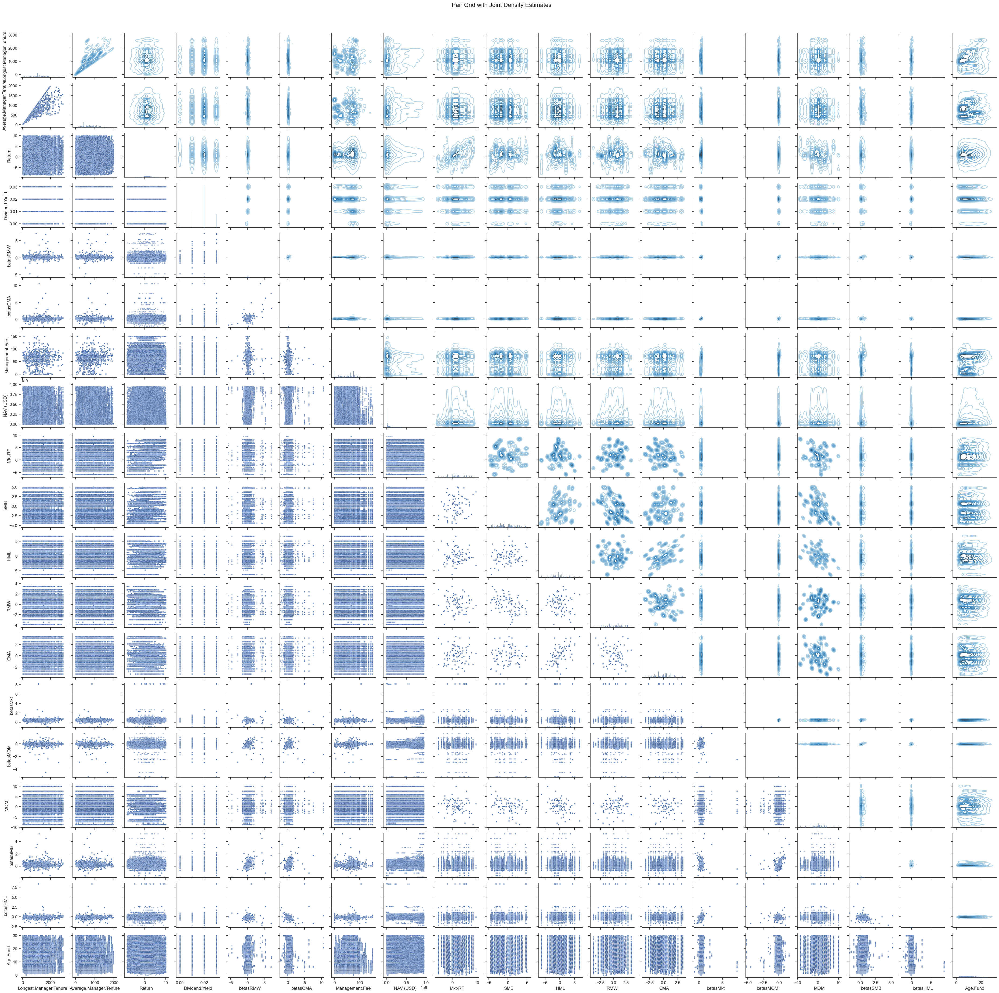

In [10]:
# Joint densities
# List of quantitative features
quant_features_ = ['Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
                   'betasRMW','betasCMA','Management.Fee', 'NAV (USD)', 'Mkt-RF', 'SMB', 'HML', 'RMW',
                   'CMA', 'betasMkt','betasMOM','MOM','betasSMB','betasHML','Age.Fund']

# Create a pair grid with kernel density estimates
pair_grid = sns.PairGrid(data[quant_features_], height=2)
pair_grid.map_upper(sns.kdeplot, cmap='Blues_d')
pair_grid.map_diag(sns.histplot, kde_kws={'color': 'k'})
pair_grid.map_lower(sns.scatterplot, s=10, alpha=0.5)

# Adjust layout
plt.subplots_adjust(top=0.95)
pair_grid.fig.suptitle('Pair Grid with Joint Density Estimates', fontsize=16)

# Show the plot
plt.show()

#  Cumulative alpha with xGradient Boosting


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


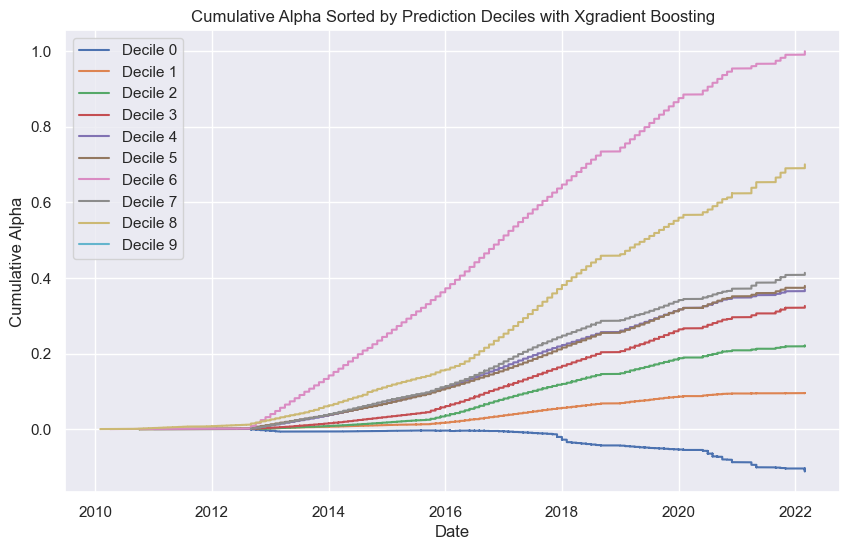

In [11]:
data = pd.read_csv(r'./data_ASMF_project.csv')

quant_features = data[['date','Longest.Manager.Tenure', 'Average.Manager.Tenure', 'Return', 'Dividend.Yield',
'betasRMW','betasCMA','Management.Fee', 'NAV (USD)', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA',
'betasMkt','betasMOM','MOM','betasSMB','betasHML','alpha','Age.Fund']]

X = quant_features.drop('alpha', axis=1)
y = quant_features['alpha']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train an XGBRegressor model on the entire dataset
model = XGBRegressor(max_depth=1, learning_rate=0.1, random_state=42)
model.fit(X_scaled, y)

# Add decile ranks based on predicted values on the entire dataset
quant_features['Predicted'] = model.predict(X_scaled)
quant_features['Decile'] = pd.qcut(quant_features['Predicted'], q=10, labels=False, duplicates='drop')

# Calculate cumulative alpha for each decile and scale to percentage
cumulative_alpha_by_decile = quant_features.groupby('Decile')['alpha'].cumsum()
total_alpha = cumulative_alpha_by_decile.max()

# Scale cumulative alpha to percentage
cumulative_alpha_percentage = (cumulative_alpha_by_decile / total_alpha) * 100

# Set seaborn style to darkgrid
sns.set(style="darkgrid")

# Plot the cumulative alpha by decile as percentage
plt.figure(figsize=(10, 6))
for decile in range(10):
    # Divide y-axis values by 100
    plt.plot(quant_features[quant_features['Decile'] == decile]['date'], cumulative_alpha_percentage[quant_features['Decile'] == decile] / 100, label=f'Decile {decile}')

plt.title('Cumulative Alpha Sorted by Prediction Deciles with Xgradient Boosting')
plt.xlabel('Date')
plt.ylabel('Cumulative Alpha')
plt.legend()
plt.show()